In [5]:
from datetime import timedelta, datetime
import cftime
import copy
import pandas as pd
import seaborn as sns
from itertools import combinations

import xarray as xr
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm, fisk
import pickle
import pyleoclim as pyleo

import cartopy.crs as ccrs
import cartopy.feature as cfeature  

import numpy as np
from multiprocessing import Pool,cpu_count
import nc_time_axis #for plotting time axis correctly with .plot() (had to update that + xarray to newest version)

from IPython.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))
display(HTML("<style>.rendered_html { font-size: 20px; }</style>"))

In [6]:
%%javascript #smooth scrolling
Jupyter.keyboard_manager.command_shortcuts.remove_shortcut('up');
Jupyter.keyboard_manager.command_shortcuts.remove_shortcut('down');

<IPython.core.display.Javascript object>

# 1. Purpose of this Notebook

This notebook contains all the code that I used to create a collection of speleothem records for South America based on the SISALv3 database and more sources.
Furthermore, I show and documented how I composited some of the records into single time series. This procedure is accompanied by plots of the time series in order to check that nothing unexpected happens.

# 2. Data Access:
    - The SISALv3 Speleothem database and records from the NOAA Database can be accessed online.
    - Some input files are csv files shared by fellow scientists, and not part of the shared data.
    - However, he final selection of proxy records, including the composited records is part of the data shared with the publication
    - **This notebook thus primarily serves documentary purposes** The data that is not shared with the publication only affects few sections of the notebook.
  
# 3. Structure
1. Loading of Proxy Record Data
2. Test Composites. Plots for each record. Decision to do composite or not.
3. Create composites and save final speleos.nc file

# 0. Helper functions

In [19]:
def plot_sg(ID):
    data=sisalv3[sisalv3['ID']==ID]
    print('Med resol',data['paleoData_hasResolution_hasMedianValue'][0])
    plt.plot(data['year'][0],data['paleoData_values'][0],'o-',markersize=1)
    

def plot_composites(input_data,name='XY Cave',turn=False,start='0001',end='2000',interp='linear',ids=['SISALv2-430','SISALv2-431'],mode='longest',masked=True,xlim=None,lw=2,s=2,figsize=(12,5),plot=True):
    """
    Function for plotting composites
    
    """
    if mode=='all': sns.set_palette('colorblind',n_colors=len(ids)*2)
    else: sns.set_palette('colorblind',n_colors=len(ids)+1)
    composites=compositor(input_data=input_data,start=start,end=end,interp=interp,ids=ids,mode=mode,masked=masked,turn=turn)    
    if plot:  
        plt.figure(figsize=figsize)
        for i in composites.data_vars:
            label=str(input_data[input_data['ID']==i]['geo_siteName'].values.tolist())[2:-2]+' ('+i+')'
            #dropped=composites[i].dropna('time') #fix that, else lines weird!
            t=composites[i].dropna('time')
            if 'composite' in label:
                #plt.plot(composites[i],'o',label=label,markersize=s,lw=1,linestyle=':')

                if xlim!=None:
                    t=t.sel(time=slice(str(xlim[0]),str(xlim[1])))
                if len(t)>0:
                    t.plot(marker='o',label=label,markersize=s,lw=1,linestyle=':')
            else:
                if xlim!=None:
                    t=t.sel(time=slice(str(xlim[0]),str(xlim[1])))
                #plt.plot(composites[i],'o-',label=label,markersize=s,lw=lw)
                if len(t)>0:
                    t.plot(marker='o',label=label,markersize=s,lw=lw,linestyle='-')
        plt.legend()
        plt.title(name,fontsize=30)
        plt.ylabel('d18O',fontsize=25)
        plt.xlabel('Year (CE)',fontsize=25)
        plt.tick_params(axis='both', which='major', labelsize=20)
    return composites


def compositor(input_data,start='0001',end='2000',interp='cubic',ids=['SISALv2-430','SISALv2-431'],mode='longest',masked=True,turn=True):
    """
    input_data=proxies[0]
    # reference time (for inclusion off all records into one table later)
    start='0001'
    end='2000'
    
    interp='linear' #interpolation of Nans
    #list of SISAL-IDs (can also be longer than two)
    ids=['SISALv2-430','SISALv2-431']
    mode='longest' #from which time-series to choose the std and mean. If all: test all combinations.
    
    returns: xarray Dataset with interpolated 
    """
    #load records
    records={i:input_data[input_data['ID']==i] for i in ids}
    originals={}
    massaged={}
    info={}
    
    times={} #for overlaps
    
    #massage time axis, mask nans
    for ID,r in records.items():
        if r['year'].shape==(1,):
            time=np.array(r['year'][0],dtype=float)
            val=np.array(r['paleoData_values'][0],dtype=float)
        else:
            time=np.array(r['year'],dtype=float)
            val=np.array(r['paleoData_values'],dtype=float)

        #mask nans
        mask1=~np.isnan(time)
        time=time[mask1]; val=val[mask1]
        mask2=~np.isnan(val)
        time=time[mask2]; val=val[mask2]

        #convert fractional year to datetime. annoying, but thats how it works
        #(does it do the right thing for negative years?) 
        #(fractional years/resolution are very unrealistic for such resolutions, but keep that in m)
        year=time.astype(int)
        days=(time - year)*365
        d = np.array([timedelta(t) for t in days])
        day_one = np.array([cftime.DatetimeProlepticGregorian(y,1,1) for y in year])
        date = d + day_one
        date= np.array([cftime.DatetimeProlepticGregorian(year[i],date[i].month,1) for i,j in enumerate(year)])
        #date=xr.CFTimeIndex(date) #not necessarily needed

        #order values
        idx=np.argsort(date)
        date=date[idx]
        val=val[idx]

        xarray=xr.DataArray(val,dims=('time'),coords={'time':date})
        #cut to desired time-axis
        #import pdb
        #pdb.set_trace()
        
        xarray=xarray.sel(time=slice(start,end))
    
        
        #print median Resolutions (computed on originaly time, as that makes it easier to recognize sub-annually resolved proxy records)
        med_resol=np.round(np.abs(np.median(time[1:]-time[:-1])),1)
        start_rec=xarray.time.dt.year[0].values#.tolist()[0]
        end_rec=xarray.time.dt.year[-1].values#.tolist()[0]
                                   
        #resample to annual resolution (important both for sub-annually + more than annual resolved time series). Here I don't care about sub-annual stuff (not realistic anyway)
        xarray=xarray.resample(time='YS').mean()

        #interpolate. Save original gaps for masking at the end
        xarray_new=xarray.interpolate_na(dim='time', method=interp)

        #interchange time axis (values at beginning end will be filled with nans)
        years = np.arange(int(start),int(end))
        # Create a cftime array with the year as the first element of the tuple, and the month and day as the subsequent elements
        time_target = [cftime.DatetimeProlepticGregorian(y, 1, 1) for y in years]
        l=end_rec-start_rec #get length of record
        xarray_new=xarray_new.reindex({'time':time_target})
        xarray=xarray.reindex({'time':time_target}) #also reindex non interpolated time series, makes finding gaps easiers.
        times[ID]=set(xarray_new.dropna('time').time.dt.year.values)
        
        #Demean + Std=1 for all timeseries. Save the std + mean. Compute that on non interpolated time series.
        mean,std=xarray.mean('time',skipna=True).values,xarray.std('time',skipna=True).values
        dic={'mean':mean,'std':std,'length':l}
        info[ID]=dic
        if turn:
            try:
                doi=r['pub1_doi'].values[0]
            except:
                doi=' '
            print('Median resolution ' ,ID,':', med_resol,' years. Record going from ',start_rec,'-',end_rec, 'CE','(',end_rec-start_rec,'years)',' | mean: ',np.round(mean,1),' std: ',np.round(std,2),' | doi: ',doi)
        #xarray_new=(xarray_new-mean)/std #Done later

        #save interpolated+standardized and non-interpolated time series
        originals[ID]=xarray
        massaged[ID]=xarray_new

    #Overlay standardized time series
    originals=xr.Dataset(originals)
    massaged=xr.Dataset(massaged)
    if len(ids)>1:
        composite=np.array([np.nan]*len(xarray_new.time))
        alone={}
        for i,t in times.items():
            for ii,tt in times.items():
                if i!=ii:
                    t=set(t)-set(tt)   
            alone[i]=np.sort(list(t))
        
        for j,jj in alone.items():
            #convert times to indices (makes slicing easier in case I have year before 1000, as '999' is not recognised)
            if len(jj)>0:
                start_j=jj[0]-int(start)
                end_j=jj[-1]-int(start)
                #period=originals[ID].isel(time=slice(start_j,end_j+1))
                #massaged['composite'].values[start_j:end_j] = massaged['composite'].isel(time=slice(start_j,end_j))*period.std('time')+period.mean('time')
                #period=originals[ID]
                composite[start_j:end_j+1]=originals[j].values[start_j:end_j+1]
                #massaged['composite'].values[start_j:end_j] = massaged['composite'].isel(time=slice(start_j,end_j))*period.std('time')+period.mean('time')
        if mode=='longest': #keep that for consistency below
            #Problem: get all possible overlaps (especially complicated when more than two lists) and get years without problem
            arrays=[list(t) for t in times.values()]
            #Initialize the dictionary
            overlap_dict = {}
            # Calculate overlaps for all combinations
            for r in range(2, len(arrays) + 1):
                for combination in combinations(enumerate(arrays), r):
                    indices, arrs = zip(*combination)
                    overlap = arrs[0]
                    for arr in arrs[1:]:
                        overlap = np.intersect1d(overlap, arr)
                    overlap_dict[indices] = overlap                
            #replace in overlap section (There are some unnecessary double calculations here. However, they do not cause harm.
            for indices, overlap in overlap_dict.items():
                if len(overlap)>0:
                    #get indices of overlap
                    start_j=overlap[0]-int(start)
                    end_j=overlap[-1]-int(start)
                    #from the indices get the one with the longest 
                    lengths=np.array([info[ids[i]]['length'] for i in indices])
                    
                    longest=ids[indices[np.argmax(lengths)]]
                    
                    period=massaged[longest].isel(time=slice(start_j,end_j+1))
                    #destandardize/demean for overlap period
                    #import pdb
                    #pdb.set_trace()
                    #org=originals.isel(time=slice(start_j,end_j+1))
                    org=massaged.isel(time=slice(start_j,end_j+1))
                    #import pdb
                    #pdb.set_trace()
                    #org=(massaged.isel(time=slice(start_j,end_j+1))-org.mean('time'))/org.std('time')
                    org=(org-org.mean('time'))/org.std('time')
                    #mean = org.to_array(dim='new').mean('new',skipna=True)
                    #bubu=org.assign(composite=mean)['composite'].values
                    bubu = org.to_array(dim='new').mean('new',skipna=True).values
                    #massaged['composite'].values[start_j:end_j] = bubu*period.std('time').values+period.mean('time').values
                    
                    composite[start_j:end_j+1] = bubu*period.std('time').values+period.mean('time').values
            massaged['composite']=('time',composite)
        #mask original gaps
        if masked:  
            good_times=np.sort(np.unique(np.concatenate([originals[i].dropna('time').time.values for i in originals])))
            bad_times=list(set(time_target)-set(good_times)) #check times which are not part of original time series
            if mode=='all':
                for i in originals:
                    for t in bad_times:
                        massaged['composite'+' ('+i+')'].loc[{'time':t}]=np.nan
                    originals['composite'+' ('+i+')']=massaged['composite'+' ('+i+')']
            else:
                for t in bad_times:
                    massaged['composite'].loc[{'time':t}]=np.nan
                originals['composite']=massaged['composite']
        else:
            if mode=='all':
                for i in originals:
                    originals['composite'+' ('+i+')']=massaged['composite'+' ('+i+')']
            else:
                originals['composite']=massaged['composite']
    return originals

def dataframe_cftime(data,time_idx='year',vals_idx='paleoData_values'):
    from datetime import timedelta, datetime
    """
    For a dataframe as input convert the values in the fractional years into datetime
    """
    data=data.copy(deep=True)
    frac_year=data[time_idx].values
    vals=data[vals_idx].values
    #loop over each record
    for i,time in enumerate(frac_year):
        #convert to numpy arrays and elimnate NANs
        time=np.array(time,dtype=float)
        val=np.array(vals[i],dtype=float)

        mask1=~np.isnan(time)
        time=time[mask1]
        val=val[mask1]
        mask2=~np.isnan(val)
        time=time[mask2]
        val=val[mask2]

        #convert fractional year to datetime
        year=time.astype(int)
        days=(time - year)*365
        d = np.array([timedelta(t) for t in days])
        day_one = np.array([cftime.DatetimeProlepticGregorian(y,1,1) for y in year])
        date = d + day_one
        #getting the datetime correctly is a bit annoying, but it works
        date= np.array([cftime.DatetimeProlepticGregorian(year[i],date[i].month,1) for i,j in enumerate(year)])
        date=xr.CFTimeIndex(date)

        #convert to datetime64
        #date=np.array(date,dtype='datetime64')

        #order values
        idx=np.argsort(date)
        date=date[idx]
        val=val[idx]

        #replace in initial array
        frac_year[i]=date
        vals[i]=val
    
    #replace initial columns
    data['year']=frac_year
    data['paleoData_values']=vals
    return data

def fracyears(time,data):
    from datetime import timedelta, datetime
    """
    Converts fractional years (e.g 1950.2) to cftime index
    """
    #loop over each record
    #for i,time in enumerate(frac_year):
        #convert to numpy arrays and elimnate NANs
    time=np.array(time,dtype=float)
    data=np.array(data,dtype=float)

    mask1=~np.isnan(time)
    time=time[mask1]
    data=data[mask1]
    mask2=~np.isnan(data)
    time=time[mask2]
    data=data[mask2]

    #convert fractional year to datetime
    year=time.astype(int)
    
    #exclude times smaller 0
    
    
    days=(time - year)*365
    d = np.array([timedelta(t) for t in days])
    #import pdb
    #pdb.set_trace()
    day_one = np.array([cftime.DatetimeProlepticGregorian(j,1,1) for i,j in enumerate(year)])
    date = d + day_one
    #getting the datetime correctly is a bit annoying, but it works
    date= np.array([cftime.DatetimeProlepticGregorian(year[i],date[i].month,1) for i,j in enumerate(year)])
    date=xr.CFTimeIndex(date)

    #convert to datetime64
    #date=np.array(date,dtype='datetime64')
    #order values
    idx=np.argsort(date)
    time=date[idx]
    data=data[idx]

    return time,data

def table_to_xarray(data,start=1,end=2000):
    """
    start and end included
    """
    #paleoData_values
    num_prox=data.shape[0]
    num_time=end-start+1
    empty=np.full((num_time,num_prox),np.nan)
    
    for ii,(i,d) in enumerate(data.iterrows()):
        time=d['year']
        vals=d['paleoData_values']
        #eventually replace time
        if (type(time)!=xr.coding.cftimeindex.CFTimeIndex) & (type(time[0])!=cftime._cftime.DatetimeGregorian):
            time,vals=fracyears(time,vals)
        array=xr.DataArray(vals,coords={'time':time})
        #resample to annual
        
        #BUG/PROBLEM. TIMES <0 CAN NOT BE RESAMPLED. THUS LIMIT THE DATE TO 1
        #import pdb
        #pdb.set_trace()
        
        array=array.sel(time=slice('0001',None))
        
        
        array=array.resample(time='YS').mean()
        
        #throw out indices that are too small or too large (according to start + end)
        years=(array.time.dt.year.values-start)
        array=array[(years>=0) & (years<=(end-start))]
        indices=array.time.dt.year-start
        
        #find right indices to fill
        empty[indices,ii]=array.values
        #import pdb
        #pdb.set_trace()
        
    time=xr.cftime_range(start=cftime.datetime(start,1,1,calendar='gregorian'),end=cftime.datetime(end,1,1,calendar='gregorian'),freq='YS',inclusive='both')
    xarray=xr.DataArray(empty,coords={'time':time},dims=('time','site'))
    

    meta_list=[
#'ID', 
        'paleoData_variableName', 'archiveType', 
       'geo_meanLat', 'geo_meanLon', 'geo_siteName',
        'minYear', 'maxYear', 
       'PSM', 'seasonality', 'variable', 'noise_snr', 'regression_params_a',
       'regression_params_b', 'regression_params_var',
        'variable_name',
          'pub1_doi', 
        ]
    cols=data.columns.intersection(meta_list)
    sub_df=data[cols]
 
    for x in sub_df:
        xarray[x]=('site',sub_df[x].values)
    
    #import pdb
    #pdb.set_trace()
    
    return xarray

def all_in_one(
    data,
    ID=['SISALv2-430','SISALv2-431'],
    title=None,
    start='0001',
    end='2000',
    interp='linear',
    mode='longest',
    masked=True,
    xlim=None,
    lw=2,
    s=2,
    figsize=(13,6),
    #width_ratios=(1,1)
    gridspec=(2,2),
    #figsize=(5,7),
    map_extent=[242,327,-65,30,],
    scattersize=400,
    edgecolors='black',
    fontsize=25,
):
    """
    Plots of:
        - proxy record location
        - time series of single records/composites
        - power spectral densities of both
    """
    
    #PLOT SET UP
    fig = plt.figure(layout="constrained",figsize=figsize)
    if title!=None:
        fig.suptitle(title,fontsize=fontsize)
    else:
        fig.suptitle(data[data['ID']==ID[0]]['geo_siteName'].values[0],fontsize=fontsize)
    gs0 = fig.add_gridspec(2, 2)

    #(1) PLOT MAP
    #ax_map = fig.add_subplot(gs00[0,0],projection=ccrs.PlateCarree())
    ax_map = fig.add_subplot(gs0[:,0],projection=ccrs.PlateCarree())
    ax_map.add_feature(cfeature.COASTLINE,zorder=1)
    gl=ax_map.axes.gridlines(color='black',alpha=0.5,linestyle='--',draw_labels=True, dms=True, x_inline=False, y_inline=False)
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 18}
    gl.ylabel_style = {'size': 18}
    # PLOT LOCATION
    locs=data[data['ID']==ID[0]]
    lats,lons=locs['geo_meanLat'].values,locs['geo_meanLon'].values
    ax_map.set_extent(map_extent, crs=ccrs.PlateCarree())
    ax_map.stock_img()
    #plot location
    scatter=ax_map.scatter(lons,lats,c='orange',s=scattersize, transform=ccrs.PlateCarree(),marker='*', edgecolors=edgecolors,zorder=1)

    #(2) CREATE COMPOSITES IF NECESSARY + PLOT THE TIME SERIES
    #ax_ts= fig.add_subplot(gs01[0,0])
    ax_ts= fig.add_subplot(gs0[0,1])
    composites=compositor(input_data=data,start=start,end=end,interp=interp,ids=ID,mode=mode,masked=masked) #also works for single record!
    if mode=='all': cols=sns.color_palette('colorblind',n_colors=len(ID)*2)
    else: cols=sns.color_palette('colorblind',n_colors=len(ID)+1)
    for ii,i in enumerate(composites.data_vars):
        label=str(data[data['ID']==i]['geo_siteName'].values.tolist())[2:-2]+' ('+i+')'
        t=composites[i].dropna('time')
        if 'composite' in label:
            if xlim!=None: t=t.sel(time=slice(str(xlim[0]),str(xlim[1])))
            if len(t)>0: t.plot(marker='o',label=label,markersize=s,lw=1,linestyle=':',c=cols[ii])
        else:
            if xlim!=None: t=t.sel(time=slice(str(xlim[0]),str(xlim[1])))
            if len(t)>0: t.plot(marker='o',label=label,markersize=s,lw=lw,linestyle='-',c=cols[ii])
    #ax_ts.legend()
    ax_ts.set_ylabel('d18O',fontsize=25)
    ax_ts.set_xlabel('Year (CE)',fontsize=25)
    ax_ts.tick_params(axis='both', which='major', labelsize=20)

    #(3) PLOT LOMB-SCARGLE, LIMITEDSPECTRA
    #ax_spectra= fig.add_subplot(gs01[0,1])
    ax_spectra= fig.add_subplot(gs0[1,1])
    method='lomb_scargle' #doesn't require evenly spaced arrays, therefore I use this one as a quick fix.
    for ii,i in enumerate(composites.data_vars):
        d=composites[i].values
        py_ser=pyleo.Series(value=d,time=np.arange(len(d)),time_name='time',time_unit='year',label='other')
        test=py_ser.spectral(method=method,settings={'standardize':False})
        label=str(data[data['ID']==i]['geo_siteName'].values.tolist())[2:-2]+' ('+i+')'
        if 'composite' in label:
            label='composite'
        test.plot(ax=ax_spectra,label=label,color=cols[ii])
        ax_spectra.set_xlim(100,2)
        ax_spectra.set_ylabel('PSD',fontsize=25)
        ax_spectra.set_xlabel('Period (yrs)',fontsize=25)

    return composites


# 1. Load SISAL + other data

In [107]:
#Paths to CSV files
sample='/home/mchoblet/raw_data/proxies/SISAL_v3/sample.csv'
ox_values='/home/mchoblet/raw_data/proxies/SISAL_v3/d18O.csv'
locs='/home/mchoblet/raw_data/proxies/SISAL_v3/site.csv'
or_chrono='/home/mchoblet/raw_data/proxies/SISAL_v3/original_chronology.csv'
entity='/home/mchoblet/raw_data/proxies/SISAL_v3/entity.csv'
pub_doi=pd.read_csv('/home/mchoblet/raw_data/proxies/SISAL_v3/reference.csv')
ref_link=pd.read_csv('/home/mchoblet/raw_data/proxies/SISAL_v3/entity_link_reference.csv')

#Load to Pandas DF
sample=pd.read_csv(sample)
ox_value=pd.read_csv(ox_values)
locs=pd.read_csv(locs)
#original chronologies
or_chrono=pd.read_csv(or_chrono)
#site entity link
entity=pd.read_csv(entity)

####Select columns in dataframes####

#sample_id + d18O_measurement + d18O_precision + iso_std
ox=ox_value[['sample_id','d18O_measurement','d18O_precision']]
#sample id + time
time=or_chrono[['sample_id','interp_age']]
#entity id + sample it + mineralogy type
entity_min=sample[['entity_id','sample_id','mineralogy']]
#site_id + site_name + latitude + longitude + elevation
loc=locs[['site_id','site_name','latitude','longitude','elevation']]
#site_id #+entity_id
site_ent=entity[['site_id','entity_id']]


#####Merge dataframes (SQL like joins)

#link entity_min and site_ent over the entity_id
step1=pd.merge(site_ent,entity_min,on='entity_id')
#add time
step2=pd.merge(step1,time,on='sample_id')
#merge with ox values
step3=pd.merge(step2,ox,on='sample_id')
#merge with location info
step4=pd.merge(step3,loc,on='site_id')

#add doi
step5=pd.merge(step4,ref_link,on='entity_id')
step6=pd.merge(step5,pub_doi[['publication_DOI','ref_id']],on='ref_id').drop(columns='ref_id')

#time filtering
step6=step6[step6['interp_age']<2000]
step6['longitude']=step6['longitude'] % 360
step6=step6.rename(columns={'longitude':'lon','latitude':'lat'})

#apply south/central america filter
step6=step6[(step6['lat']<30) & (step6['lat']>-65) & (step6['lon']<340) & (step6['lon']>250)]
step6['interp_age']=1950-step6['interp_age']

""
#Create Tables with 1 row for each year and 1 column for each proxy entity, non existing values are nan
data1=pd.pivot_table(step6[['entity_id','interp_age','d18O_measurement']],index='interp_age',columns='entity_id')#.to_numpy()
data2=pd.pivot_table(step6[['entity_id','interp_age','d18O_precision']],index='interp_age',columns='entity_id')#.to_numpy()
#change the time to BP
data1.index=1950-data1.index

loc_reduced=step6.drop_duplicates('entity_id')[['entity_id','site_id','lat','lon','elevation','mineralogy','site_name','publication_DOI']].sort_values('entity_id')
lat=loc_reduced['lat'].values
lon=loc_reduced['lon'].values
elev=loc_reduced['elevation'].values
mineral=loc_reduced['mineralogy'].values
sitename=loc_reduced['site_name'].values
entity_id=loc_reduced['site_id'].values
entity_id=loc_reduced['entity_id'].values
doi=loc_reduced['publication_DOI'].values


new_table=step6.groupby('entity_id')['d18O_measurement'].apply(list).reset_index(name='values')

new_table['lat']=lat
new_table['lon']=lon
new_table['elev']=elev
new_table['mineral']=mineral
new_table['sitename']=sitename
new_table['doi']=doi

new_table['median_resol']=step6.groupby('entity_id')['interp_age'].apply(lambda x: np.median(np.abs(np.array(x[~np.isnan(x)])[1:]-np.array(x[~np.isnan(x)])[:-1]))).values
new_table['minYear']=step6.groupby('entity_id')['interp_age'].min().values
new_table['maxYear']=step6.groupby('entity_id')['interp_age'].max().values
new_table['time']=step6.groupby('entity_id')['interp_age'].apply(lambda x: np.array(x[~np.isnan(x)])).values

new_table['entity_id']='SISALv2-'+new_table['entity_id'].apply(str)
new_table=new_table.rename(columns={'entity_id':'ID','values':'paleoData_values','lat':'geo_meanLat','lon':'geo_meanLon','sitename':'geo_siteName','elev':'geo_meanElev','median_resol':'paleoData_hasResolution_hasMedianValue','time':'year','doi':'pub1_doi'})#.reset_index(level='ID')
new_table=new_table.set_index('ID')

sisalv3=new_table
sisalv3['paleoData_variableName']=np.array(['d18O']*len(sisalv3))
sisalv3['archiveType']=np.array(['speleothem']*len(sisalv3))
sisalv3['paleoData_units']=np.array(['permil']*len(sisalv3))


"""
#add Marcelo Arevalo cave (Schimpf 2011) NOT USED BECAUSE DATA IS NOT PUBLIC
path='/home/mchoblet/south_america/proxies/valdir_newdata/Marcelo Arevalo.xlsx'
time=1950-pd.read_excel('/home/mchoblet/south_america/proxies/valdir_newdata/Marcelo Arevalo.xlsx',sheet_name=None,skiprows=5,usecols='B')['Sheet1'].values.flatten()
values=pd.read_excel('/home/mchoblet/south_america/proxies/valdir_newdata/Marcelo Arevalo.xlsx',sheet_name=None,skiprows=5,usecols='D')['Sheet1'].values.flatten()
time=time[~np.isnan(values)]
values=values[~np.isnan(values)]
assert len(time)==len(values)
dic={'ID':'MA 1','paleoData_variableName':'d18O','archiveType':'speleothem','paleoData_units':'permil','paleoData_values':values,
     'geo_meanElev':20,'geo_meanLat':-52.7,'geo_meanLon':360-73.38,
     'geo_siteName':'Marcelo Arevalo Cave','year':time,'minYear':np.min(time),'maxYear':np.max(time),
     'paleoData_hasResolution_hasMedianValue':np.abs(np.median(time[1:]-time[:-1])),
     'pub1_doi':'https://doi.org/10.1016/j.quascirev.2010.12.006'}
df=pd.DataFrame([dic]).set_index('ID')
sisalv3=pd.concat([sisalv3,df]).sort_values('geo_meanLat',ascending=False)
"""


import urllib.request

# Download the file
url = "https://www.ncei.noaa.gov/pub/data/paleo/speleothem/southamerica/peru/cascayunga2009.txt"
filename = "cascayunga2009.txt"
urllib.request.urlretrieve(url, filename)

###CAVE - D
# Read the file and extract the desired data
year_ad = []
d18o_values = []
section_found = False

with open(filename, 'r', encoding='ISO-8859-1') as file:
    for line in file:
        if line.startswith('3. Cascayunga Cave Speleothem CAS-D'):
            section_found = True
            next(file)  # Skip the header line
            next(file) 
            continue
        if section_found and line.strip() == '':
            break
        if section_found:
            data = line.split()
            year_ad.append(float(data[1]))
            try:
                d18o_values.append(float(data[2]))
            except:
                d18o_values.append(np.nan)

#Cascayunga Cave
lat=-6.4; lon=360-77.11; elev=900   
time=np.array(year_ad);values=np.array(d18o_values)
    
# Print the extracted data
#for year, d18o in zip(year_ad, d18o_values):
#    print(f"YearAD: {year}\t d18O (per mil PDB): {d18o}")
time=time[~np.isnan(values)]
values=values[~np.isnan(values)]
assert len(time)==len(values)
dic={'ID':'Cascayunga cave - D','paleoData_variableName':'d18O','archiveType':'speleothem','paleoData_units':'permil','paleoData_values':values, 'geo_meanElev':elev,
     'geo_meanLat':lat,'geo_meanLon':lon,'geo_siteName':'Cascayunga Cave',
     'year':time,'minYear':np.min(time),'maxYear':np.max(time),'paleoData_hasResolution_hasMedianValue':np.abs(np.median(time[1:]-time[:-1])),
    'pub1_doi':'https://doi.org/10.1029/2009GL041051',
    'mineral':'calcite'}
df=pd.DataFrame([dic]).set_index('ID')
sisalv3=pd.concat([sisalv3,df]).sort_values('geo_meanLat',ascending=False)

##CAVE A

# Read the file and extract the desired data
year_ad = []
d18o_values = []
section_found = False

with open(filename, 'r', encoding='ISO-8859-1') as file:
    for line in file:
        if line.startswith('2. Cascayunga Cave Speleothem CAS-A'):
            section_found = True
            next(file)  # Skip the header line
            next(file) 
            continue
        if section_found and line.strip() == '':
            break
        if section_found:
            data = line.split()
            year_ad.append(float(data[1]))
            try:
                d18o_values.append(float(data[2]))
            except:
                d18o_values.append(np.nan)

#Cascayunga Cave
lat=-6.4; lon=360-77.11; elev=900   
time=np.array(year_ad);values=np.array(d18o_values)
    
# Print the extracted data
#for year, d18o in zip(year_ad, d18o_values):
#    print(f"YearAD: {year}\t d18O (per mil PDB): {d18o}")
time=time[~np.isnan(values)]
values=values[~np.isnan(values)]
assert len(time)==len(values)
dic={'ID':'Cascayunga cave - A','paleoData_variableName':'d18O','archiveType':'speleothem','paleoData_units':'permil','paleoData_values':values, 'geo_meanElev':elev,
     'geo_meanLat':lat,'geo_meanLon':lon,'geo_siteName':'Cascayunga Cave','year':time,'minYear':np.min(time),'maxYear':np.max(time),'paleoData_hasResolution_hasMedianValue':np.abs(np.median(time[1:]-time[:-1])),
     'pub1_doi':'https://doi.org/10.1029/2009GL041051','mineral':'calcite'}
df=pd.DataFrame([dic]).set_index('ID')
sisalv3=pd.concat([sisalv3,df]).sort_values('geo_meanLat',ascending=False)


try:
    #Caripe cave (VECA), Coordinates -10.17, -63.55, altitude 1090
    time=1950-pd.read_excel('/home/mchoblet/south_america/proxies/valdir_newdata/data for Mathi_v2.ods',sheet_name=None,skiprows=5,usecols='Z')['Sheet1'].values.flatten()
    values=pd.read_excel('/home/mchoblet/south_america/proxies/valdir_newdata/data for Mathi_v2.ods',sheet_name=None,skiprows=5,usecols='AB')['Sheet1'].values.flatten()
    time=time[~np.isnan(values)]
    values=values[~np.isnan(values)]
    assert len(time)==len(values)
    dic={'ID':'Caripe Cave','paleoData_variableName':'d18O','archiveType':'speleothem','paleoData_units':'permil','paleoData_values':values,
         'geo_meanElev':1090,'geo_meanLat':10.17,'geo_meanLon':360-63.55,'geo_siteName':'Caripe Cave','year':time,'minYear':np.min(time),'maxYear':np.max(time),
         'paleoData_hasResolution_hasMedianValue':np.abs(np.median(time[1:]-time[:-1])),
        'pub1_doi':'https://doi.org/10.1016/j.quascirev.2023.108056'}
    df=pd.DataFrame([dic]).set_index('ID')
#   speleos=pd.concat([speleos,df]).sort_values('geo_meanLat',ascending=False)
    sisalv3=pd.concat([sisalv3,df]).sort_values('geo_meanLat',ascending=False)
except:
    print('Caripe Cave could not be loaded. Note that the original data sheet is not shared with this publication, but the final proxy record selection is.')

#sisalv2 list

first_sel=[
'SISALv2-443', #dos anas
'SISALv2-147', #tzabnah
'SISALv2-378' ,#perdida cave
'SISALv2-286', #juxtlahuaca
'SISALv2-178', #macal chasm
'SISALv2-209', #yok balum
'Caripe Cave',
'SISALv2-424', #paraiso (composite)
'SISALv2-434', #shatuca cave
'SISALv2-94', #palestina cave
'SISALv2-128', #pau dalho
'SISALv2-449', #jaragua cave
'MA 1', #marcelo arevalo
'SISALv2-97', #tamboril cave
]
sisalv3['ID']=sisalv3.index
speleos=sisalv3[sisalv3['ID'].isin(first_sel)]

#ADD MORE RECORDS

#cristal cave, Vuille 2012, Coorninates: -24.52; -48.59, Altitude: 160
try:
    time=1950-pd.read_excel('/home/mchoblet/south_america/proxies/valdir_newdata/data for Mathi.ods',sheet_name=None,skiprows=5,usecols='G')['Sheet1'].values.flatten()
    values=pd.read_excel('/home/mchoblet/south_america/proxies/valdir_newdata/data for Mathi.ods',sheet_name=None,skiprows=5,usecols='I')['Sheet1'].values.flatten()
    time=time[~np.isnan(values)]
    values=values[~np.isnan(values)]
    assert len(time)==len(values)
    dic={'ID':'Cristal Cave','paleoData_variableName':'d18O','archiveType':'speleothem','paleoData_units':'permil',
         'paleoData_values':values, 'geo_meanElev':365,'geo_meanLat':-24.52,'geo_meanLon':360-48.59,'geo_siteName':'Cristal Cave',
         'year':time,'minYear':np.min(time),'maxYear':np.max(time),'paleoData_hasResolution_hasMedianValue':np.abs(np.median(time[1:]-time[:-1])),
        'pub1_doi':'https://doi.org/10.5194/cp-8-1309-2012'
        }
    df=pd.DataFrame([dic]).set_index('ID')
    df['ID']='Cristal Cave'
    sisalv3=pd.concat([sisalv3,df]).sort_values('geo_meanLat',ascending=False)
    speleos=pd.concat([speleos,df])
except:
    pass

#MATA VIRGEM 1: SISALv2-817 has the right metadata (but mv1, the record that interest me and that has values in the anomaly period (1750-1850CE) not part of sisal, had to interpolate myself)
try:
    df=sisalv3[sisalv3['ID']=='SISALv2-817']
    path_mv1='/home/mchoblet/south_america/proxies/valdir_newdata/MV1_data_Vitor_Azevedo.xlsx'
    #path_mv29_30='/home/mchoblet/south_america/proxies/valdir_newdata/MV29_and_MV30.xlsx'
    dates='/home/mchoblet/south_america/proxies/valdir_newdata/Datações Tocantins.xlsx'
    #mv3=proxies[0][proxies[0]['ID']=='Mata Virgem']
    depth1=pd.read_excel(path_mv1,skiprows=0,usecols='A').to_numpy().flatten()
    vals1=pd.read_excel(path_mv1,skiprows=0,usecols='B').to_numpy().flatten()
    dates1=pd.read_excel(dates,skiprows=0,usecols='Z').to_numpy().flatten()[7:30].astype('float')
    date_depth1=pd.read_excel(dates,skiprows=0,usecols='C').to_numpy().flatten()[7:30].astype('float')

    #restrict values where actually there is a dating
    depth1_a=depth1[depth1>=date_depth1[0]]
    vals1_a=vals1[depth1>=date_depth1[0]]
    vals1_a_date=np.interp(depth1_a,date_depth1,dates1)
    vals=vals1_a
    time=vals1_a_date
    columns=df.columns
    df=df.values
    df[0][-1]='Mata Virgem 1'
    df[0][0] = vals
    df[0][8] =np.min(time)
    df[0][9] =np.max(time)
    df[0][10] =time
    df=pd.DataFrame(df,columns=columns)
    df=df.set_index('ID')
    df['ID']='Mata Virgem 1'
    sisalv3=pd.concat([sisalv3,df]).sort_values('geo_meanLat',ascending=False)
    speleos=pd.concat([speleos,df])
    df2=df
except:
    print('Mata Virgem 1 not loaded')
    pass
    
#cuica cave: SISALv2-752 (Part of SISALv3)
df=sisalv3[sisalv3['ID']=='SISALv2-752']
speleos=pd.concat([speleos,df])

#add trapia cave
df=sisalv3[sisalv3['ID']=='SISALv2-861']
speleos=pd.concat([speleos,df])


# 2. Plot Time series to decide about compositing or not

## Why  create speleothem compisites?

- At some caves, multiple speleothems ('entitities') are recorded in the SISAL database.
- Stitching record together (composite) creates "one" continous record.
    -> This makes them suited for robust statistical analysis over longer time perios ('Monte Carlo Empirical Orthogonal Functions', Paleoclimate Data Assimilation)
- Paleoclimate Data Assimilation uses proxy record anomalies over a time period shared by all used records, therefore I could not use some of the records without compositing them.

## How I computed speleothem composites

**From Novello 2021** (https://www.sciencedirect.com/science/article/pii/S0277379121000299)
Also used in Orrison 2022 (https://cp.copernicus.org/articles/18/2045/2022/). See code as reference (https://github.com/rgorrison/sams-mcoef/blob/main/SASM_MCEOF_mceofcalculation.ipynb)

**In short** (without the Monte Carlo Age Ensemble part)
1. Resample proxy time series to a shared time step (I simply use xarray resample and interpolate functions. Cubic spline vs linear?)
2. Standardization for all time series over overlap period: Zero-mean, Std=1 (save previous mean and std)
3. Compute mean/std for all curves over overlap period
4. Destandardize using mean + std of longer time series <- (for the overlap time!)

 Composites would have no gaps, as they are interpolated to annual resolution -> I therefore mask the composite with original dates, in order to get the original resolution of the merged time series.

**Why I don't care about the age model ensembles here**
1. I don't do Monte Carlo EOF.
2. In the end, I only use the speleothems on a decadal time scale (means), so the age model uncertainties should not be too important.
I therefore consider that the simpler approach is justified here.

**Decision to create a composite vs use a single record:**
- Site by site decision:
    - is it useful? (longer time series, single records not useful ...)
    - are the temporal resolutions not too different?

## Possible caveats that need to be checked via plots
- Introduction of artefacts/jumps/missing jumps?
- Changed spectral characteristics ?


Median resolution  SISALv2-861 : 2.8  years. Record going from  11 - 1932 CE ( 1921 years)  | mean:  -2.7  std:  0.89  | doi:  10.1016/j.quascirev.2020.106655


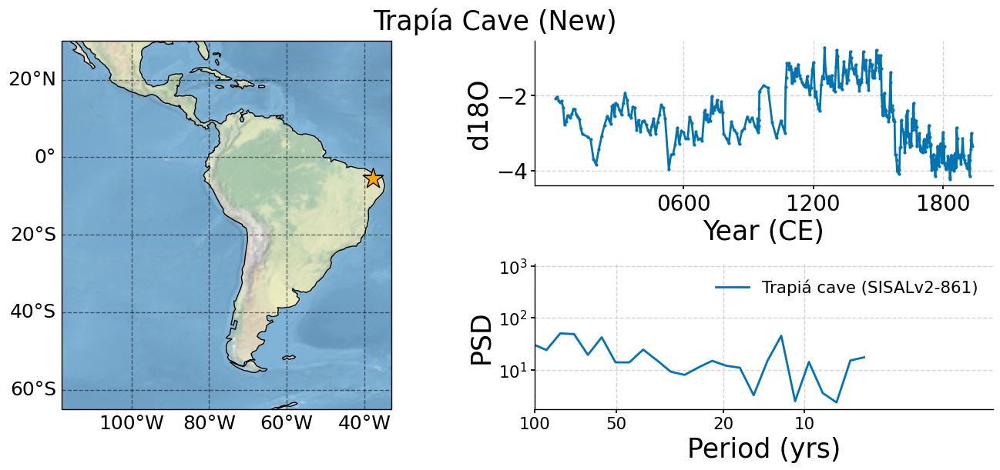

In [17]:
all_in_one(data=sisalv3,title='Trapía Cave (New)',ID=['SISALv2-861']);

Median resolution  SISALv2-113 : 4.4  years. Record going from  2 - 1911 CE ( 1909 years)  | mean:  -3.7  std:  0.67  | doi:  10.1029/2012gl053936
Median resolution  SISALv2-146 : 0.8  years. Record going from  1874 - 2000 CE ( 126 years)  | mean:  -2.8  std:  0.84  | doi:  10.1016/j.quascirev.2021.106822
Median resolution  SISALv2-203 : 0.6  years. Record going from  1910 - 2000 CE ( 90 years)  | mean:  -2.9  std:  0.79  | doi:  10.1016/j.quascirev.2021.106822


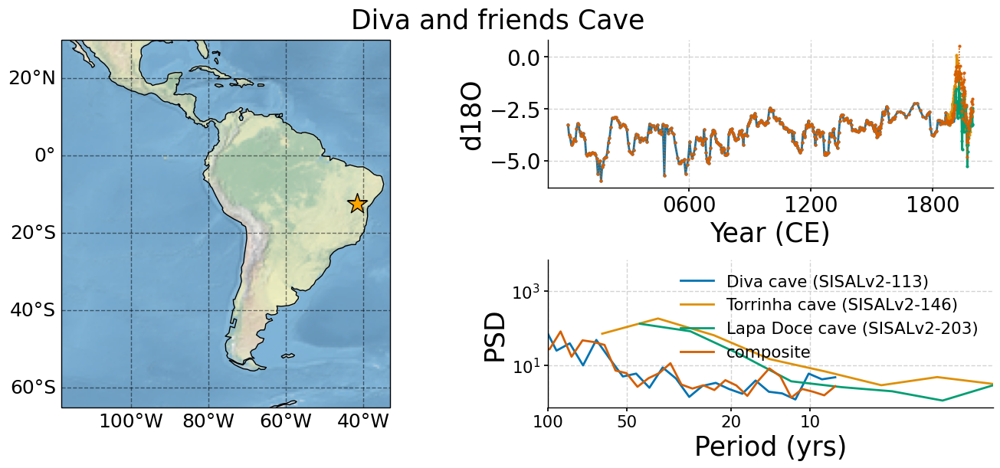

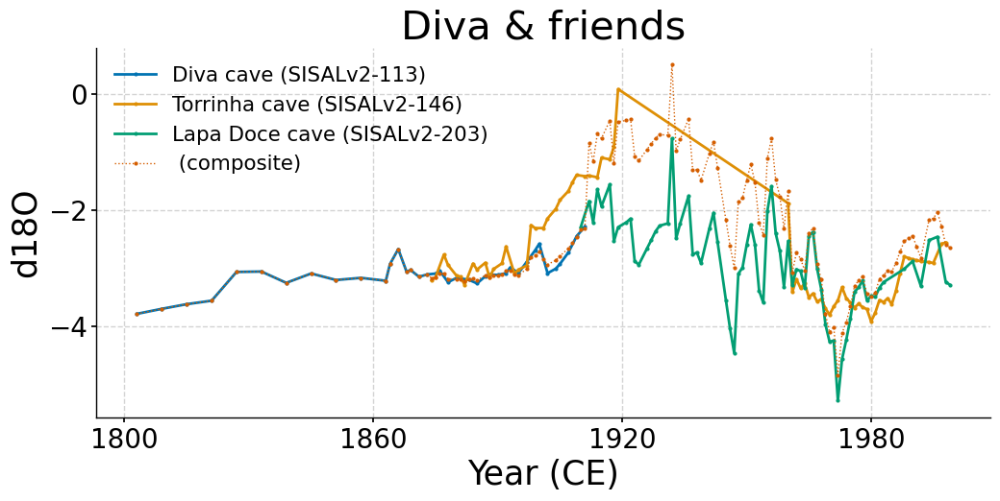

In [11]:
all_in_one(data=sisalv3,title='Diva and friends Cave',ID=['SISALv2-113','SISALv2-146','SISALv2-203']);
diva=plot_composites(input_data=sisalv3,name='Diva & friends',ids=['SISALv2-113','SISALv2-146','SISALv2-203'],mode='longest',masked=True,lw=2,s=2,turn=False,xlim=('1800','2000'));

Med resol 1.1600000000000819


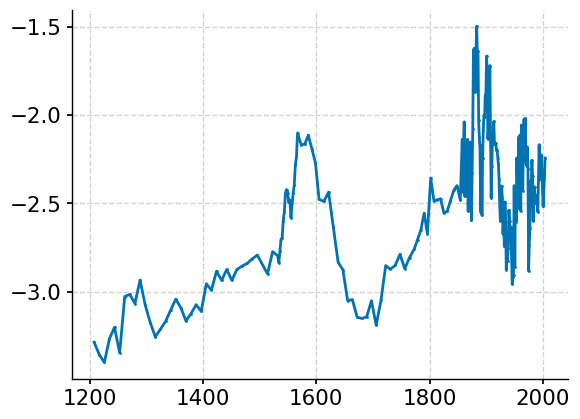

In [12]:
plot_sg('SISALv2-378')

# Caripe Cave (New record)

New interesting paper, comparison with other records, check it out: https://www.sciencedirect.com/science/article/pii/S027737912300104X

Median resolution  Caripe Cave : 1.5  years. Record going from  1 - 1993 CE ( 1992 years)  | mean:  -4.0  std:  0.48  | doi:  https://doi.org/10.1016/j.quascirev.2023.108056


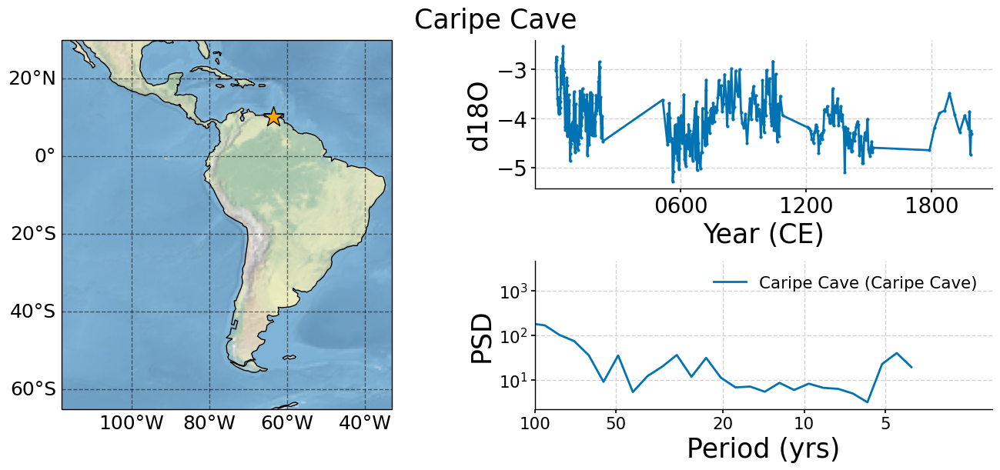

In [36]:
all_in_one(data=sisalv3,title='Caripe Cave',ID=['Caripe Cave']);

## Paraiso cave
-> We already have a composite here ? -> Weird case! My composite would not show the jump

Median resolution  SISALv2-20 : 12.7  years. Record going from  7 - 1235 CE ( 1228 years)  | mean:  -6.6  std:  0.32  | doi:  10.1038/nature20787
Median resolution  SISALv2-21 : 5.8  years. Record going from  1181 - 1998 CE ( 817 years)  | mean:  -5.7  std:  0.4  | doi:  10.1038/nature20787


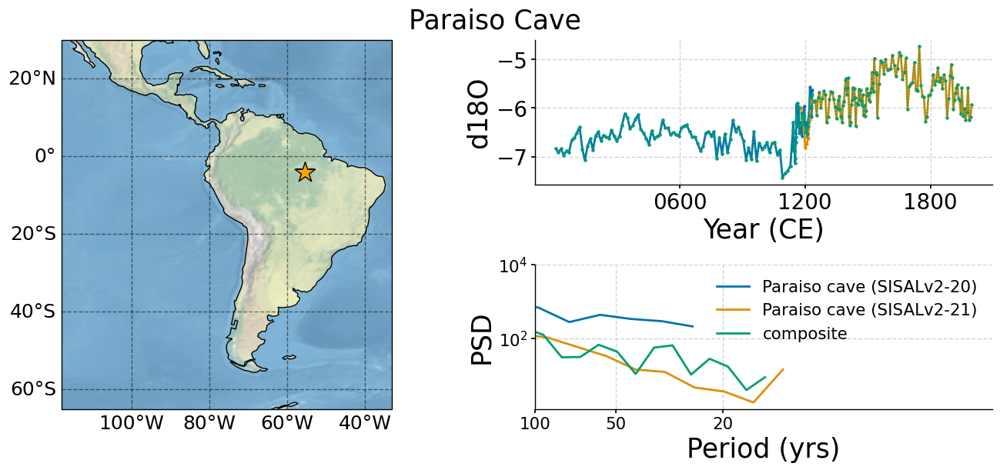

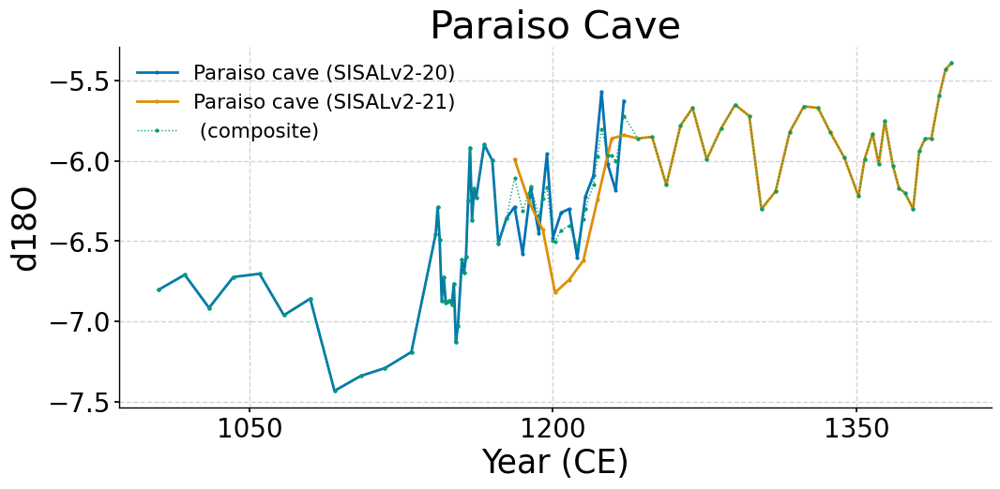

In [37]:
all_in_one(data=sisalv3,title='Paraiso Cave',ID=['SISALv2-20','SISALv2-21']);
a=plot_composites(input_data=sisalv3,name='Paraiso Cave',ids=['SISALv2-20','SISALv2-21'],xlim=('1000','1400'));

Median resolution  SISALv2-424 : 7.1  years. Record going from  7 - 1998 CE ( 1991 years)  | mean:  -6.1  std:  0.56  | doi:  10.1038/nature20787


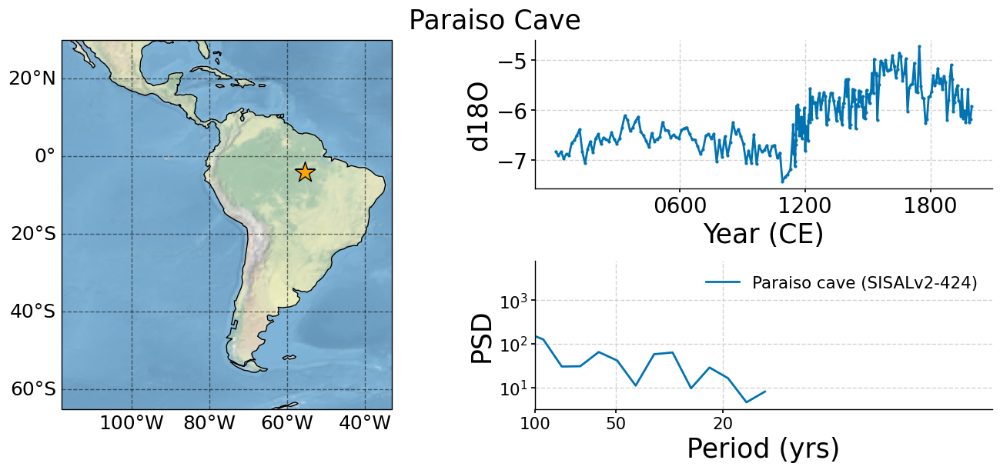

In [38]:
all_in_one(data=sisalv3,title='Paraiso Cave',ID=['SISALv2-424']);

# Shatuca cave -> Mainly hiatus over the last millennium
-> Is this already a composite of 432,433?

Median resolution  SISALv2-434 : 8.1  years. Record going from  2 - 1984 CE ( 1982 years)  | mean:  -6.2  std:  0.46  | doi:  10.1016/j.quascirev.2016.05.023


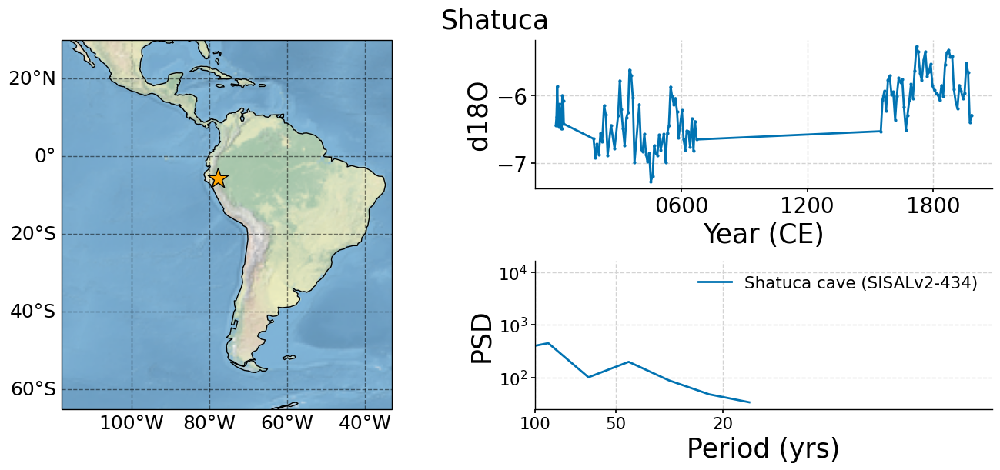

In [40]:
#SISALv2-434 SHATUCA CAVE
all_in_one(sisalv3,title='Shatuca',ID=['SISALv2-434']);

In [41]:
#all_in_one(title='Shatuca',ID=['SISALv2-432','SISALv2-433'],mode='shortest');
#all_in_one(title='Shatuca',ID=['SISALv2-432','SISALv2-433'],mode='longest');

# Cascayunga
-> Included in Pages2k (first version). Not in SISAL.

Median resolution  Cascayunga cave - D : 1.5  years. Record going from  1088 - 1907 CE ( 819 years)  | mean:  -7.3  std:  0.37  | doi:  https://doi.org/10.1029/2009GL041051


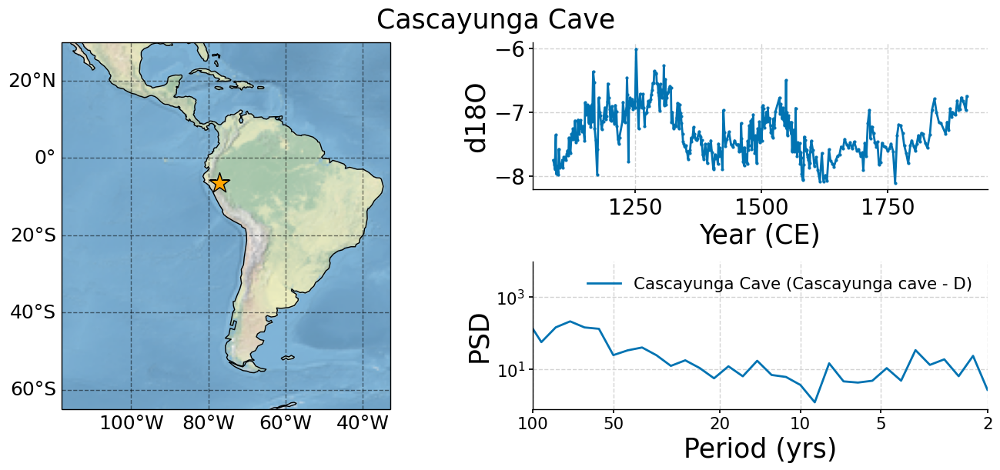

In [42]:
all_in_one(data=sisalv3,ID=['Cascayunga cave - D']);

## Palestina cave

Median resolution  SISALv2-93 : 4.0  years. Record going from  1099 - 1928 CE ( 829 years)  | mean:  -7.1  std:  0.12  | doi:  10.5194/cp-10-1967-2014
Median resolution  SISALv2-94 : 5.0  years. Record going from  413 - 1850 CE ( 1437 years)  | mean:  -7.1  std:  0.27  | doi:  10.5194/cp-10-1967-2014


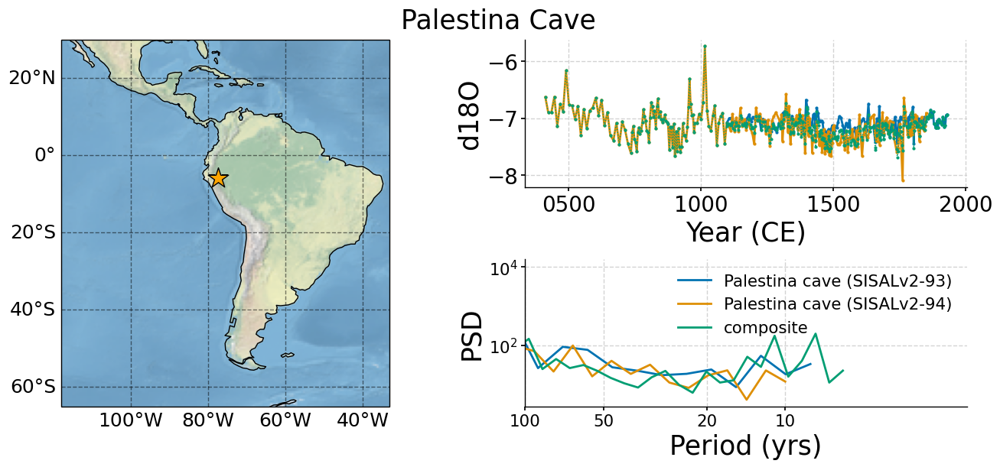

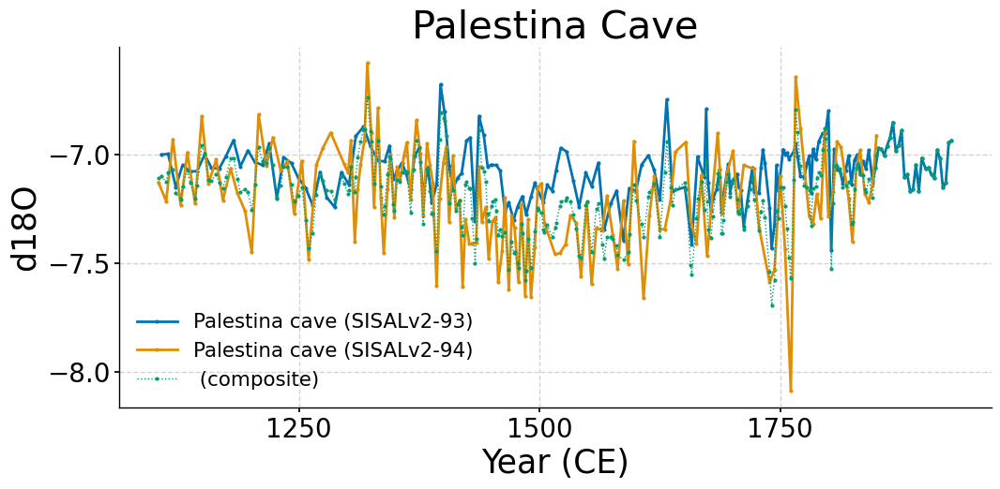

In [44]:
all_in_one(sisalv3,title='Palestina Cave',ID=['SISALv2-93','SISALv2-94']);
palestina=plot_composites(sisalv3,name='Palestina Cave',ids=['SISALv2-93','SISALv2-94'],mode='longest',masked=True,lw=2,s=2,xlim=('1100','2000'),turn=False)

## Huagapo cave

Median resolution  SISALv2-597 : 1.3  years. Record going from  3 - 904 CE ( 901 years)  | mean:  -13.0  std:  0.29  | doi:  10.1016/j.quascirev.2013.05.008
Median resolution  SISALv2-598 : 4.0  years. Record going from  559 - 2000 CE ( 1441 years)  | mean:  -13.3  std:  0.34  | doi:  10.1016/j.quascirev.2013.05.008


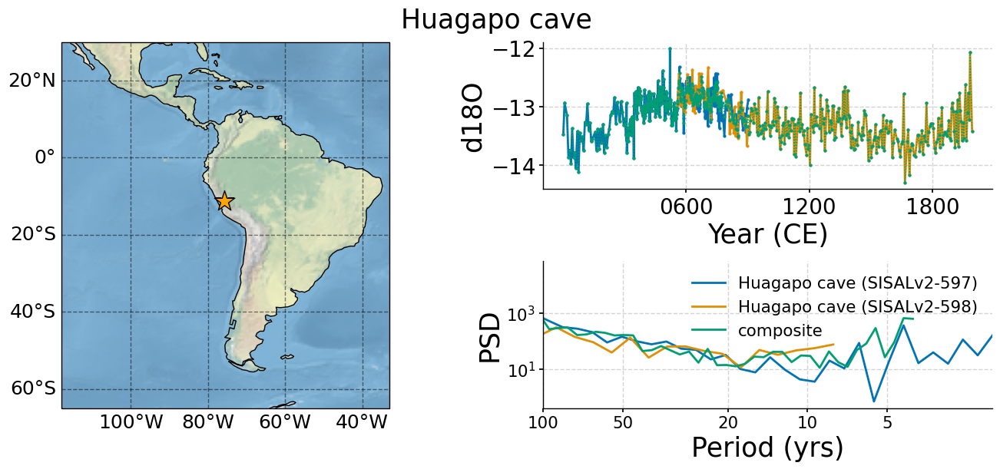

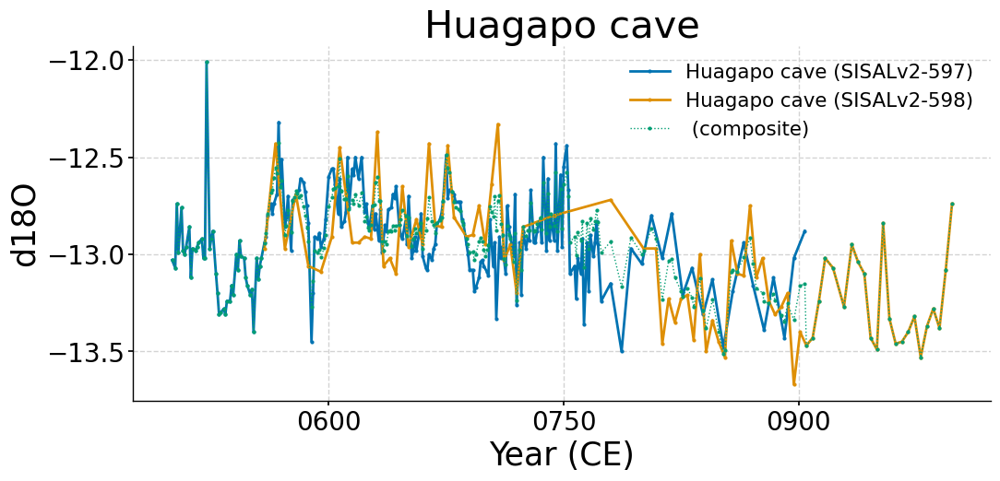

In [46]:
all_in_one(sisalv3,title='Huagapo cave',ID=['SISALv2-597','SISALv2-598']);
huagapo=plot_composites(sisalv3,name='Huagapo cave',ids=['SISALv2-597','SISALv2-598'],mode='longest',masked=True,lw=2,s=2,xlim=('0500','1000'),turn=False)

## Mata Virgem cave
-> Take Mata Virgem 3 instead of 1 + 30 as in Orrisson 2022 cause I don't have this data and MV3 is also pretty long

-> No: 1750-1850 must be included for anomaly reconstruction, pretty important. I use Mata Virgem 1.

Median resolution  Mata Virgem 1 : 1.0  years. Record going from  166 - 1814 CE ( 1648 years)  | mean:  -3.7  std:  0.47  | doi:  10.1038/s41598-019-56852-7


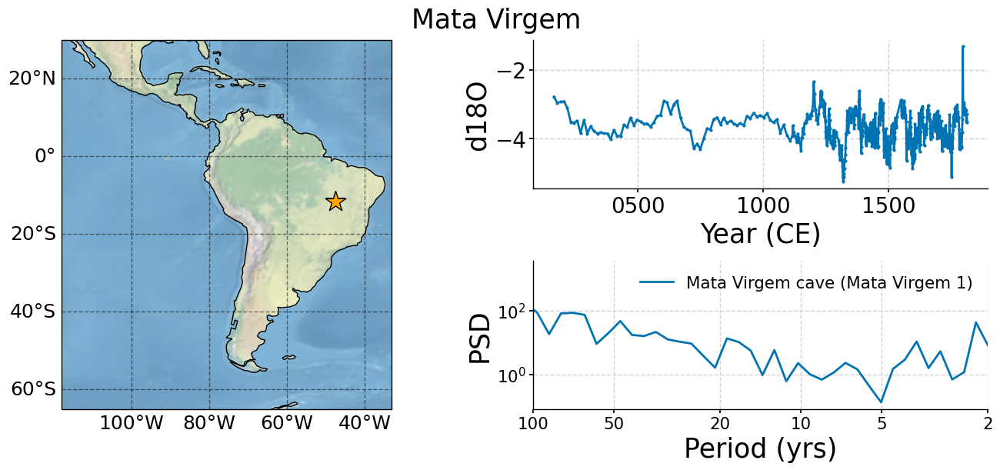

In [80]:
all_in_one(sisalv3,title='Mata Virgem',ID=['Mata Virgem 1']);
#jaragua=plot_composites(input_data=sisalv2,name='Jaragua cave',ids=['SISALv2-447','SISALv2-448'],mode='longest',masked=False,lw=2,s=2,xlim=('1000','1400'),turn=False)

# Cuica Cave

Median resolution  SISALv2-752 : 1.4  years. Record going from  338 - 2000 CE ( 1662 years)  | mean:  -6.6  std:  0.24  | doi:  10.1016/j.quascirev.2022.107383


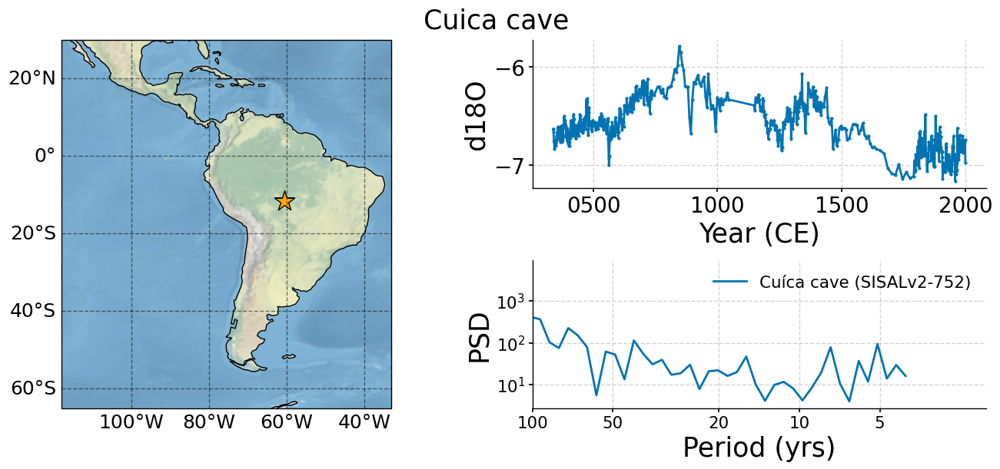

In [83]:
all_in_one(sisalv3,title='Cuica cave',ID=['SISALv2-752']);

# Diva cave

Median resolution  SISALv2-113 : 4.4  years. Record going from  2 - 1911 CE ( 1909 years)  | mean:  -3.7  std:  0.67  | doi:  10.1029/2012gl053936


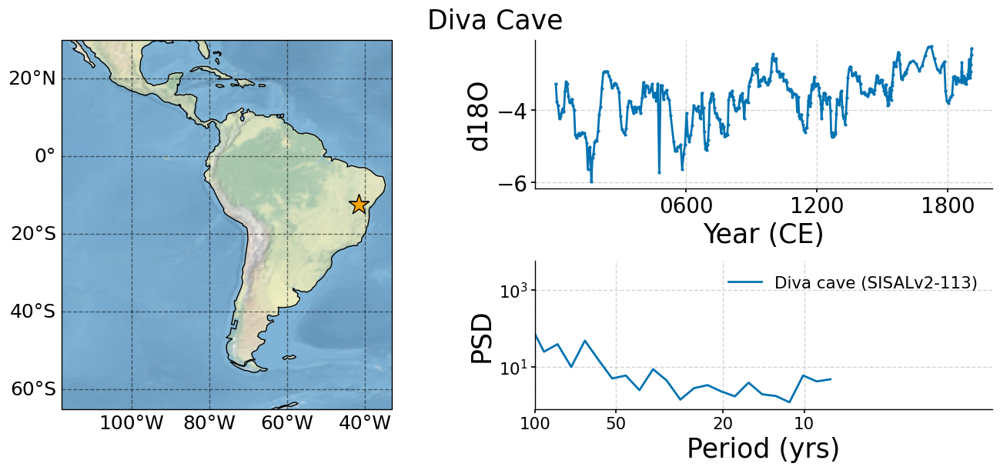

In [84]:
all_in_one(sisalv3,title='Diva Cave',ID=['SISALv2-113']);

# Diva cave + nearby caves composite
-> Also called Iraqara record

In [85]:
sisalv3[sisalv3['ID']=='SISALv2-113']

,paleoData_values,geo_meanLat,geo_meanLon,geo_meanElev,mineral,geo_siteName,pub1_doi,paleoData_hasResolution_hasMedianValue,minYear,maxYear,year,paleoData_variableName,archiveType,paleoData_units,ID
ID,,,,,,,,,,,,,,,
SISALv2-113,"[-2.28509852052, -2.45261436155, -2.7354957455...",-12.3819,318.4267,680.0,aragonite,Diva cave,10.1029/2012gl053936,4.44,-45.0,1911.0,"[1911.0, 1909.29, 1907.57, 1905.86, 1904.14, 1...",d18O,speleothem,permil,SISALv2-113


In [86]:
sisalv3[sisalv3['ID']=='SISALv2-146']

,paleoData_values,geo_meanLat,geo_meanLon,geo_meanElev,mineral,geo_siteName,pub1_doi,paleoData_hasResolution_hasMedianValue,minYear,maxYear,year,paleoData_variableName,archiveType,paleoData_units,ID
ID,,,,,,,,,,,,,,,
SISALv2-146,"[-0.0081, -1.4342, -2.5721, -2.2352, -2.54311,...",-12.3495,318.3962,680.0,aragonite,Torrinha cave,10.1016/j.quascirev.2021.106822,0.84,1874.28833,2006.59,"[2006.59, 2005.052, 2003.514, 2001.976, 2000.4...",d18O,speleothem,permil,SISALv2-146


In [87]:
sisalv3[sisalv3['ID']=='SISALv2-90'] # do not use this one, calcite, rest is aragonite!

,paleoData_values,geo_meanLat,geo_meanLon,geo_meanElev,mineral,geo_siteName,pub1_doi,paleoData_hasResolution_hasMedianValue,minYear,maxYear,year,paleoData_variableName,archiveType,paleoData_units,ID
ID,,,,,,,,,,,,,,,
SISALv2-90,"[-6.14, -6.48, -6.05, -6.18, -5.83, -5.91, -5....",-14.37,315.72,590.0,calcite,Lapa grande cave,10.1130/g32098.1,3.0,-48.0,662.0,"[662.0, 652.0, 642.0, 631.0, 621.0, 611.0, 590...",d18O,speleothem,permil,SISALv2-90


In [88]:
sisalv3[sisalv3['ID']=='SISALv2-203']

,paleoData_values,geo_meanLat,geo_meanLon,geo_meanElev,mineral,geo_siteName,pub1_doi,paleoData_hasResolution_hasMedianValue,minYear,maxYear,year,paleoData_variableName,archiveType,paleoData_units,ID
ID,,,,,,,,,,,,,,,
SISALv2-203,"[-2.56896391837, -3.56264315685, -3.2458377912...",-12.3344,318.3957,680.0,aragonite,Lapa Doce cave,10.1016/j.quascirev.2021.106822,0.65,1910.894737,2011.0,"[2011.0, 2010.35, 2009.7, 2009.05, 2008.4, 200...",d18O,speleothem,permil,SISALv2-203


Median resolution  SISALv2-113 : 4.4  years. Record going from  2 - 1911 CE ( 1909 years)  | mean:  -3.7  std:  0.67  | doi:  10.1029/2012gl053936
Median resolution  SISALv2-146 : 0.8  years. Record going from  1874 - 2000 CE ( 126 years)  | mean:  -2.8  std:  0.84  | doi:  10.1016/j.quascirev.2021.106822
Median resolution  SISALv2-203 : 0.6  years. Record going from  1910 - 2000 CE ( 90 years)  | mean:  -2.9  std:  0.79  | doi:  10.1016/j.quascirev.2021.106822


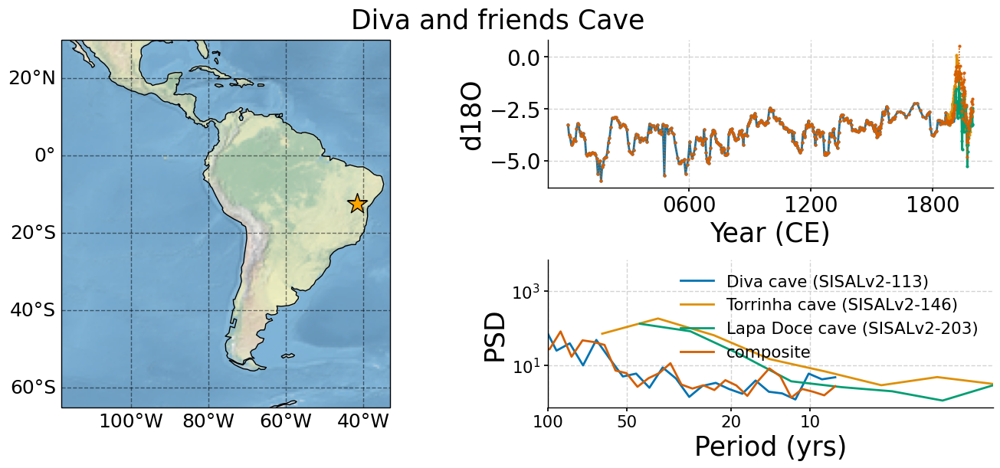

In [89]:
all_in_one(data=sisalv3,title='Diva and friends Cave',ID=['SISALv2-113','SISALv2-146','SISALv2-203']);

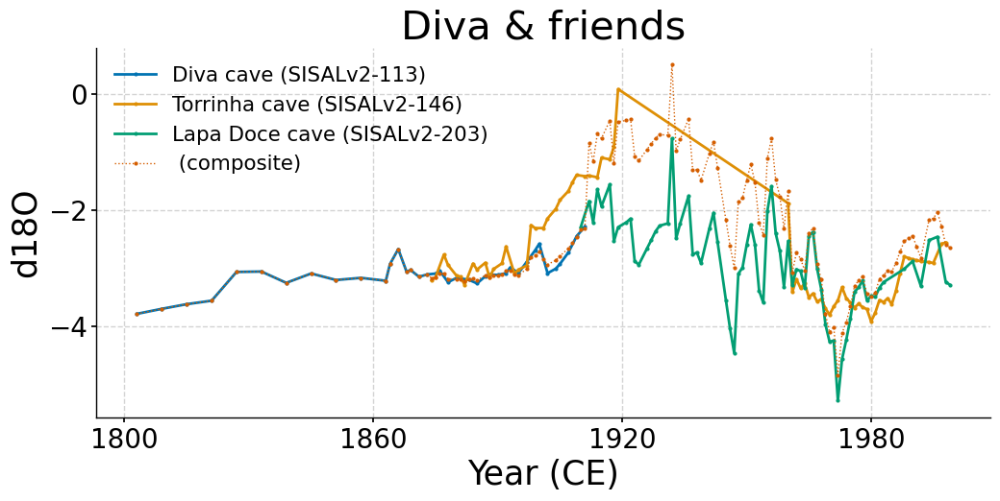

In [90]:
plot_composites(input_data=sisalv3,name='Diva & friends',ids=['SISALv2-113','SISALv2-146','SISALv2-203'],mode='longest',masked=True,lw=2,s=2,turn=False,xlim=('1800','2000'));
#,xlim=('1000','1400'),

# Sao Bernardo + Sao Matheus

Median resolution  SISALv2-430 : 0.4  years. Record going from  1123 - 2000 CE ( 877 years)  | mean:  -4.3  std:  0.35  | doi:  10.1029/2017GL076838
Median resolution  SISALv2-431 : 1.9  years. Record going from  264 - 1200 CE ( 936 years)  | mean:  -4.2  std:  0.42  | doi:  10.1029/2017GL076838


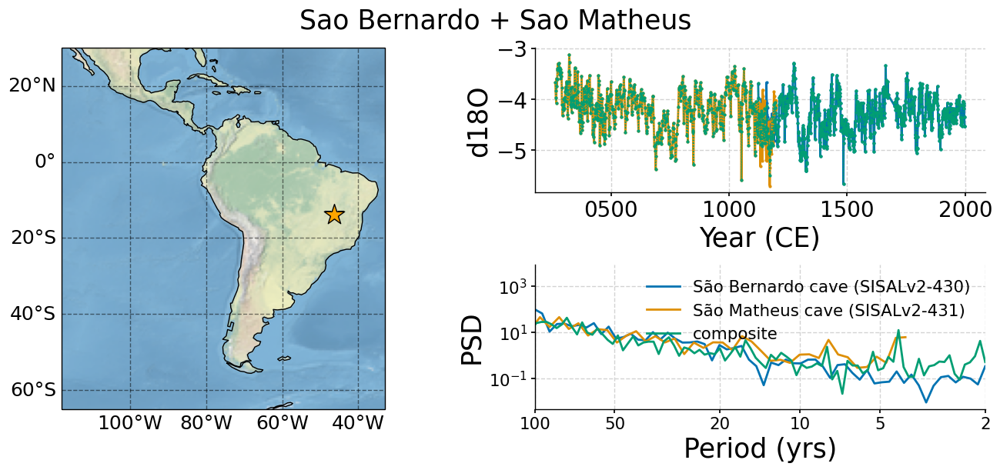

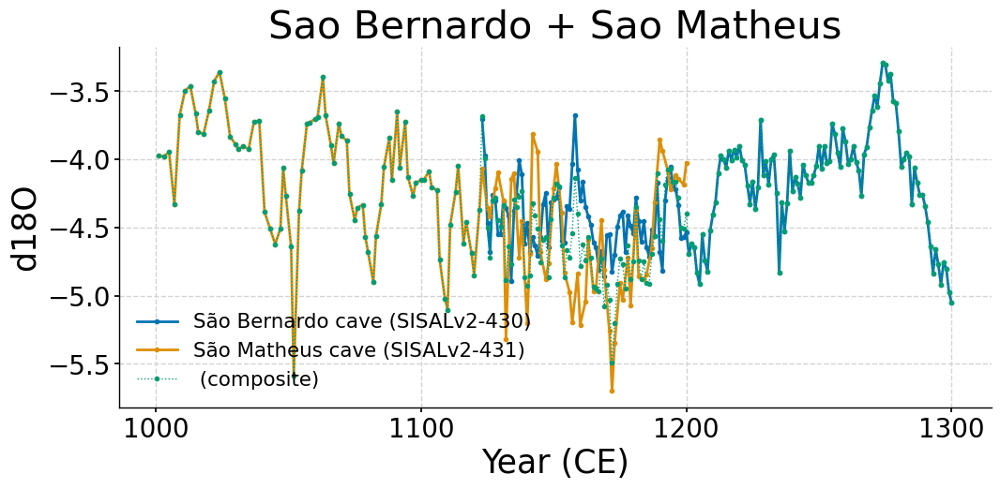

In [94]:
all_in_one(sisalv3,title='Sao Bernardo + Sao Matheus',ID=['SISALv2-430','SISALv2-431']);
b=plot_composites(sisalv3,name='Sao Bernardo + Sao Matheus',ids=['SISALv2-430','SISALv2-431'],mode='longest',masked=True,lw=2,s=3,xlim=(1000,1300),turn=False);

# Pau d'alho cave
-> Composite would need a calcite/aragonite conversion


In [95]:
sisalv3[sisalv3['ID']=='SISALv2-128']#,'SISALv2-110']

,paleoData_values,geo_meanLat,geo_meanLon,geo_meanElev,mineral,geo_siteName,pub1_doi,paleoData_hasResolution_hasMedianValue,minYear,maxYear,year,paleoData_variableName,archiveType,paleoData_units,ID
ID,,,,,,,,,,,,,,,
SISALv2-128,"[-6.12163834505, -6.5847299288, -6.69056969977...",-15.2055,303.2,340.0,calcite,Pau d'Alho cave,10.1038/srep24762,1.023995,491.67783,1860.27086,"[1860.27086, 1859.38043, 1858.49, 1857.59957, ...",d18O,speleothem,permil,SISALv2-128


In [96]:
sisalv3[sisalv3['ID']=='SISALv2-110']#,'SISALv2-110']

,paleoData_values,geo_meanLat,geo_meanLon,geo_meanElev,mineral,geo_siteName,pub1_doi,paleoData_hasResolution_hasMedianValue,minYear,maxYear,year,paleoData_variableName,archiveType,paleoData_units,ID
ID,,,,,,,,,,,,,,,
SISALv2-110,"[-7.08, -7.84, -7.75, -7.73, -7.7, -7.98, -7.8...",-15.2002,303.2161,420.0,aragonite,Curupira cave,10.1038/srep24762,0.4,1795.1,1971.0,"[1971.0, 1969.6, 1969.0, 1968.3, 1967.7, 1967....",d18O,speleothem,permil,SISALv2-110


Median resolution  SISALv2-128 : 1.0  years. Record going from  491 - 1860 CE ( 1369 years)  | mean:  -6.1  std:  0.52  | doi:  10.1038/srep24762
Median resolution  SISALv2-110 : 0.4  years. Record going from  1795 - 1971 CE ( 176 years)  | mean:  -7.6  std:  0.37  | doi:  10.1038/srep24762


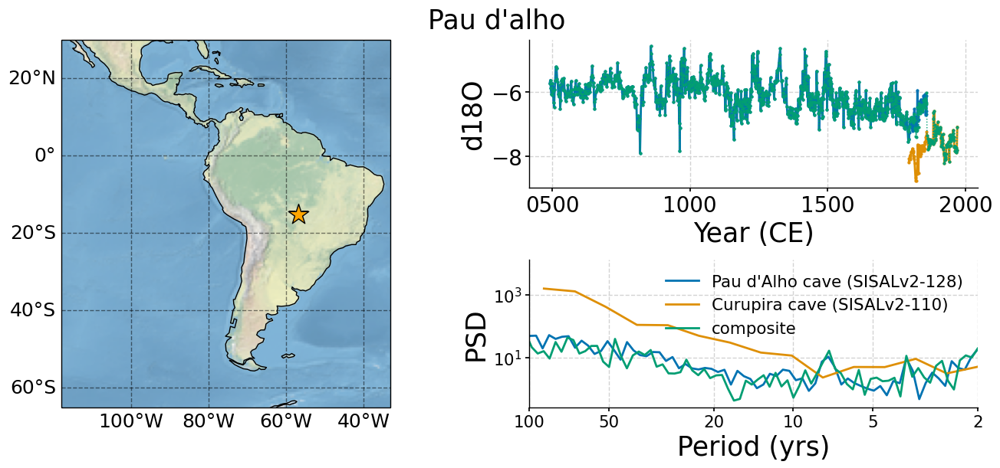

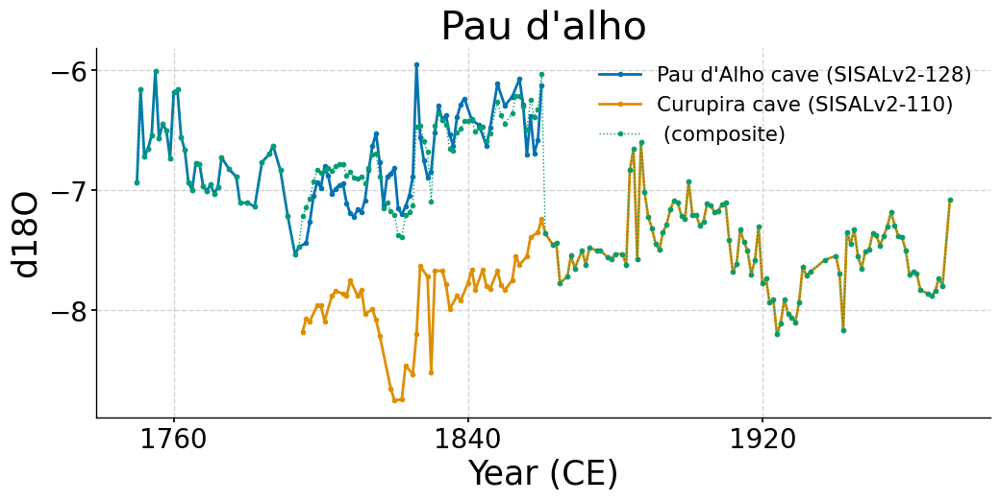

In [99]:
all_in_one(sisalv3,title='Pau d\'alho',ID=['SISALv2-128','SISALv2-110']);
b=plot_composites(sisalv3,name='Pau d\'alho',ids=['SISALv2-128','SISALv2-110'],mode='longest',masked=True,lw=2,s=3,xlim=(1750,2000),turn=False);

# Tamboril

Median resolution  SISALv2-97 : 2.1  years. Record going from  272 - 1982 CE ( 1710 years)  | mean:  -5.4  std:  0.72  | doi:  10.1016/j.epsl.2017.01.034
Median resolution  SISALv2-594 : 6.9  years. Record going from  345 - 1008 CE ( 663 years)  | mean:  -6.0  std:  0.41  | doi:  10.1016/j.quascirev.2019.02.019


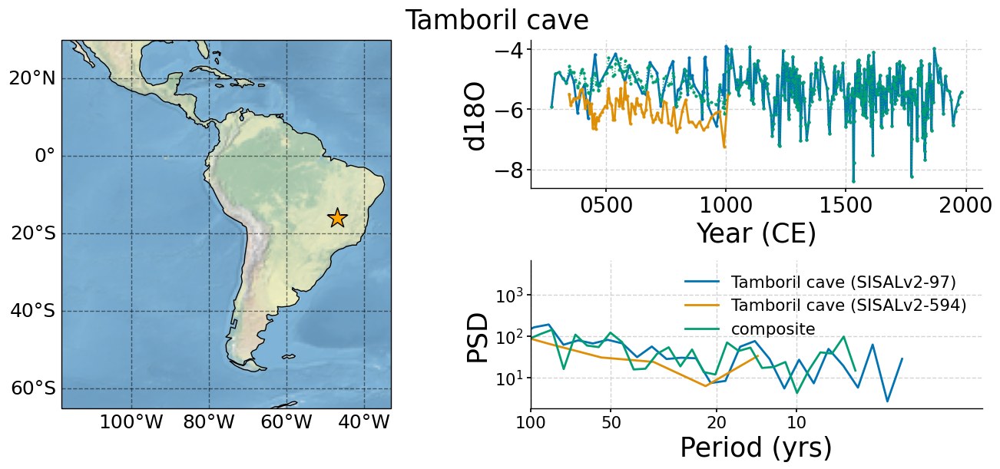

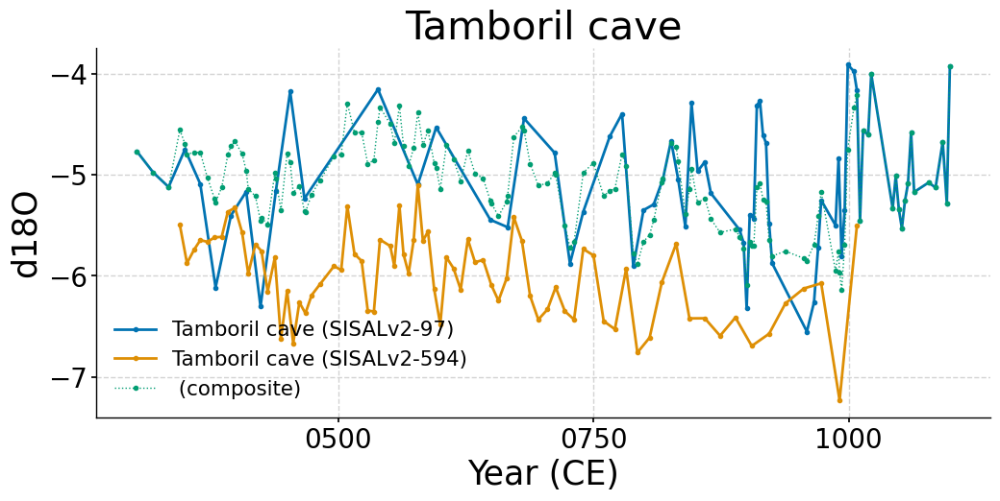

In [100]:
all_in_one(sisalv3,title='Tamboril cave',ID=['SISALv2-97','SISALv2-594']);
tamboril=plot_composites(sisalv3,name='Tamboril cave',ids=['SISALv2-97','SISALv2-594'],mode='longest',masked=True,lw=2,s=3,xlim=('0300','1100'),turn=False)

## Umajalanta- Chiflonka Caves

Median resolution  SISALv2-499 : 1.4  years. Record going from  1651 - 1863 CE ( 212 years)  | mean:  -10.8  std:  0.37  | doi:  10.1016/j.epsl.2018.04.048
Median resolution  SISALv2-497 : 7.0  years. Record going from  1592 - 1726 CE ( 134 years)  | mean:  -10.2  std:  0.49  | doi:  10.1016/j.epsl.2018.04.048
Median resolution  SISALv2-498 : 2.2  years. Record going from  1011 - 1762 CE ( 751 years)  | mean:  -9.7  std:  0.59  | doi:  10.1016/j.epsl.2018.04.048
Median resolution  SISALv2-518 : 2.6  years. Record going from  620 - 1295 CE ( 675 years)  | mean:  -9.6  std:  0.55  | doi:  10.1016/j.epsl.2018.04.048


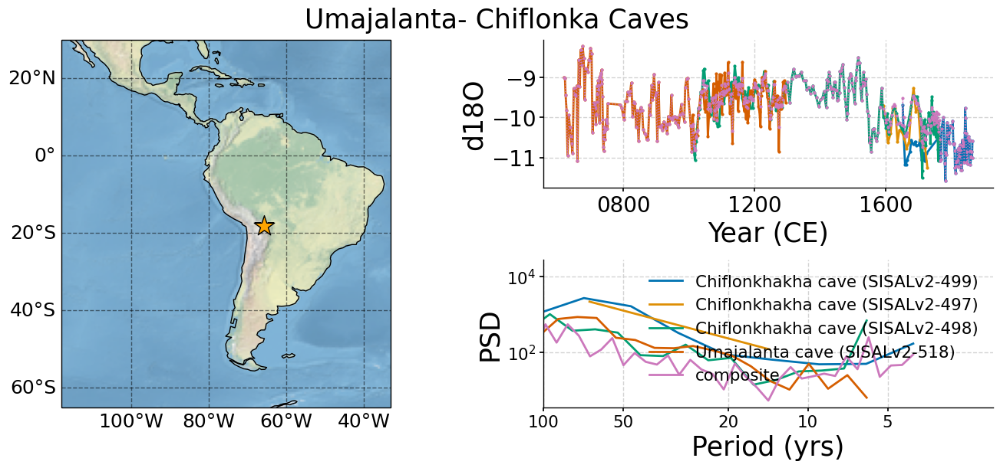

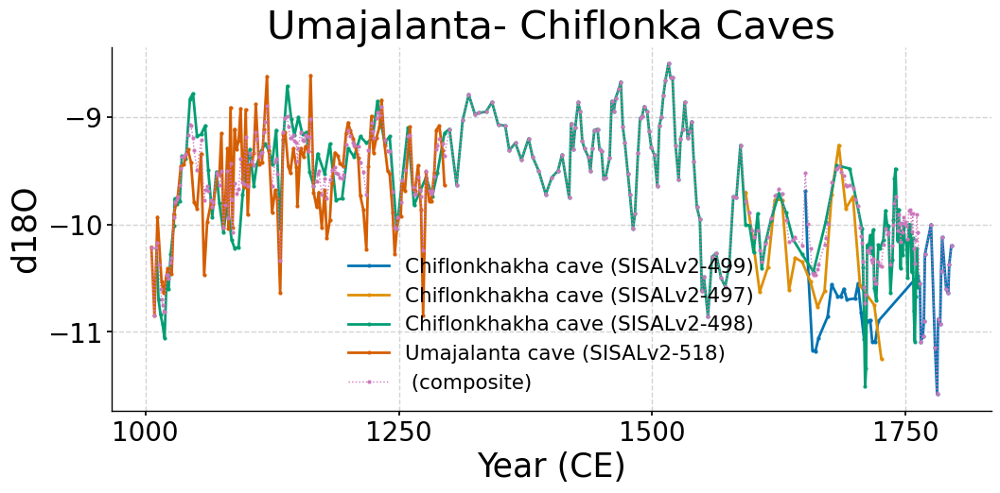

In [101]:
#new
all_in_one(sisalv3,title='Umajalanta- Chiflonka Caves',ID=['SISALv2-499','SISALv2-497','SISALv2-498','SISALv2-518']);
Uma=plot_composites(sisalv3,name='Umajalanta- Chiflonka Caves',ids=['SISALv2-499','SISALv2-497','SISALv2-498','SISALv2-518'],mode='longest',masked=True,turn=False,xlim=('1000','1800'))

# Jaragua cave
- there is already a composite in SISAL (449), compute my own anyway for consistency

Median resolution  SISALv2-447 : 3.4  years. Record going from  1191 - 2000 CE ( 809 years)  | mean:  -4.8  std:  0.61  | doi:  10.1038/srep44267
Median resolution  SISALv2-448 : 2.8  years. Record going from  422 - 1451 CE ( 1029 years)  | mean:  -3.8  std:  0.68  | doi:  10.1038/srep44267


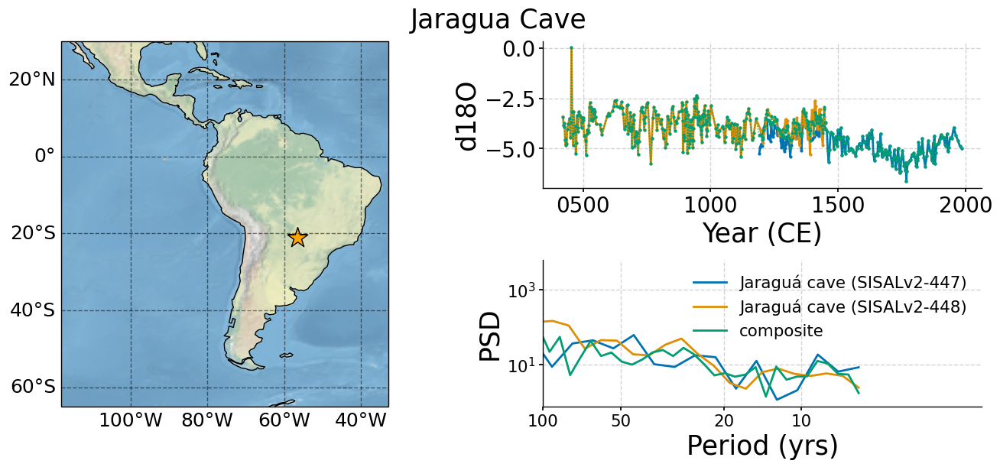

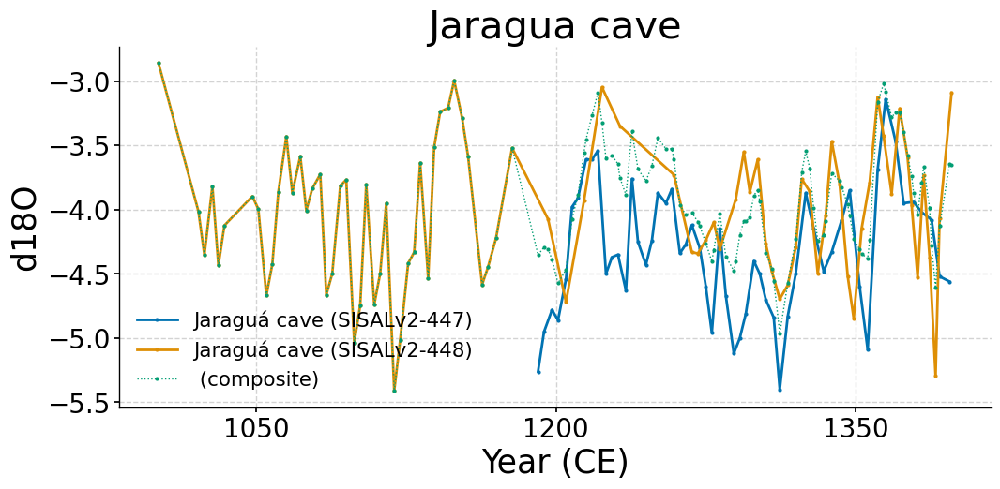

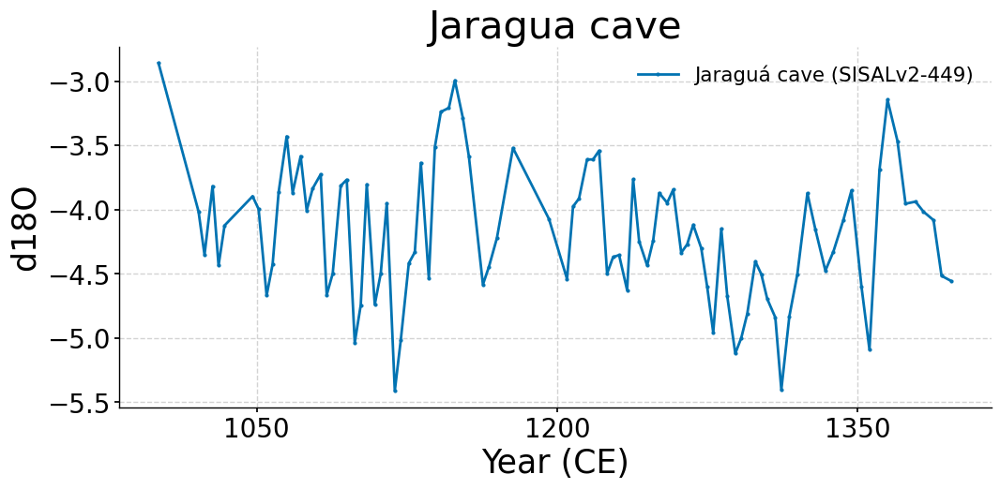

In [102]:
all_in_one(data=sisalv3,title='Jaragua Cave',ID=['SISALv2-447','SISALv2-448'],interp='cubic');
jaragua=plot_composites(input_data=sisalv3,name='Jaragua cave',interp='cubic',ids=['SISALv2-447','SISALv2-448'],mode='longest',masked=True,lw=2,s=2,xlim=('1000','1400'),turn=False)
jaragua2=plot_composites(input_data=sisalv3,name='Jaragua cave',interp='cubic',ids=['SISALv2-449'],mode='longest',masked=False,lw=2,s=2,xlim=('1000','1400'),turn=False);

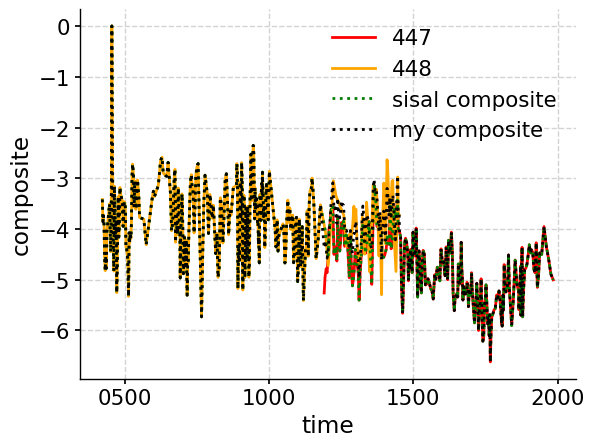

In [103]:
jaragua['SISALv2-447'].dropna('time').plot(label='447',c='red')
jaragua['SISALv2-448'].dropna('time').plot(label='448',c='orange')
jaragua2['SISALv2-449'].dropna('time').plot(label='sisal composite',c='green',ls=':')
jaragua['composite'].dropna('time').plot(label='my composite',c='black',ls=':')
plt.legend()

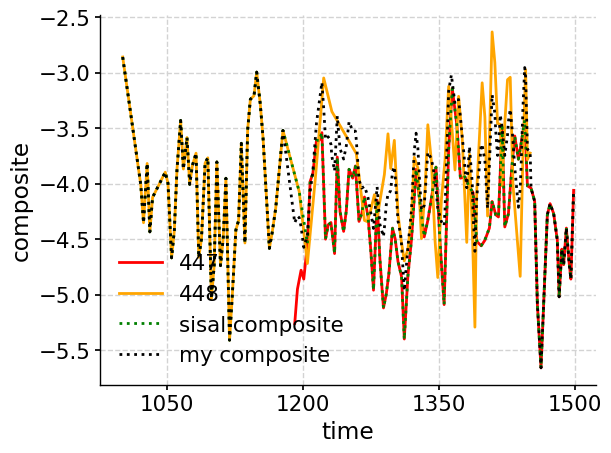

In [104]:
jaragua['SISALv2-447'].dropna('time').sel(time=slice('1000','1500')).plot(label='447',c='red')
jaragua['SISALv2-448'].dropna('time').sel(time=slice('1000','1500')).plot(label='448',c='orange')
jaragua2['SISALv2-449'].dropna('time').sel(time=slice('1000','1500')).plot(label='sisal composite',c='green',ls=':')
jaragua['composite'].dropna('time').sel(time=slice('1000','1500')).plot(label='my composite',c='black',ls=':')
plt.legend()

# Cristal cave

Median resolution  Cristal Cave : 1.5  years. Record going from  42 - 1998 CE ( 1956 years)  | mean:  -5.3  std:  0.67  | doi:  https://doi.org/10.5194/cp-8-1309-2012


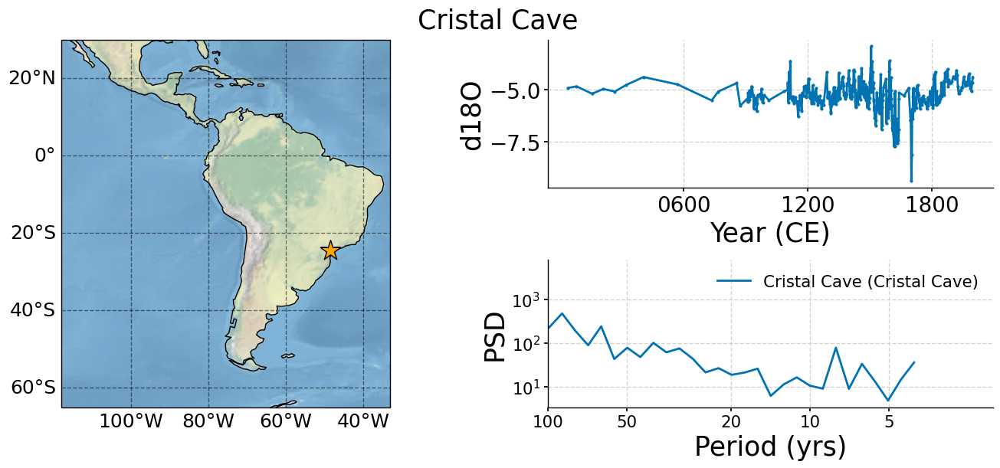

In [108]:
all_in_one(sisalv3,title='Cristal Cave',ID=['Cristal Cave']);

# Marcelo Arevalo (Excluded as data not public)

Median resolution  MA 1 : 2.2  years. Record going from  2 - 1997 CE ( 1995 years)  | mean:  -6.4  std:  0.33


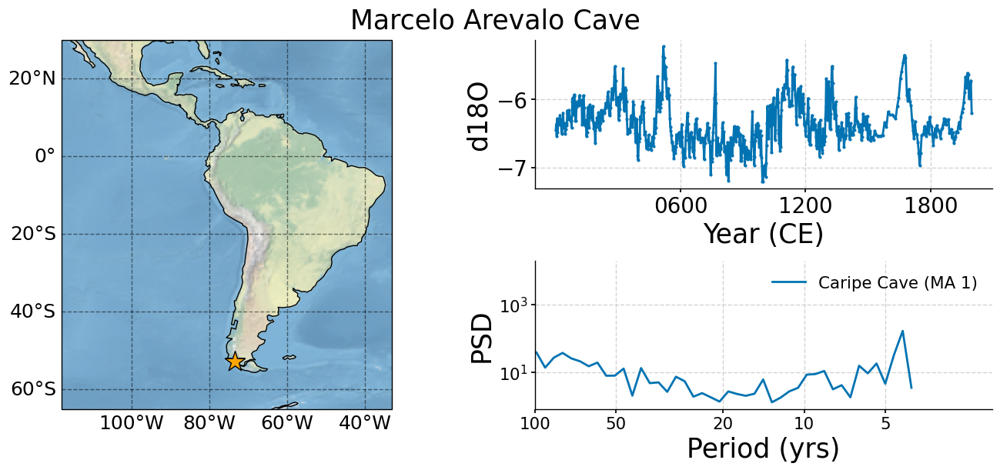

In [272]:
#all_in_one(data=sisalv,title='Marcelo Arevalo Cave',ID=['MA 1']);

# Central America

# Natural Bridge Caverns -> hiatus too large. not interesting for me
10.1016/j.quascirev.2015.06.023 	

Median resolution  SISALv2-127 : 5.3  years. Record going from  34 - 1931 CE ( 1897 years)  | mean:  -4.2  std:  0.38  | doi:  10.1016/j.quascirev.2015.06.023


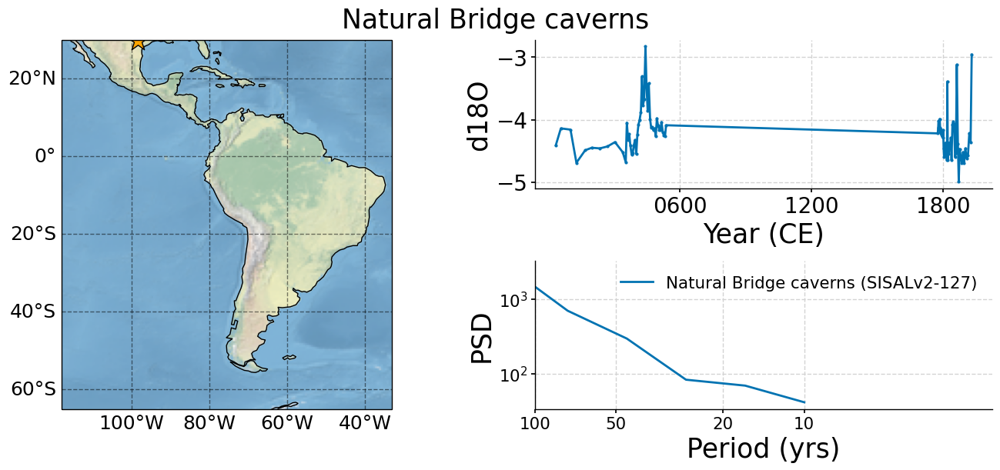

In [109]:
all_in_one(sisalv3,title='Natural Bridge caverns',ID=['SISALv2-127']);

Median resolution  SISALv2-395 : 23.8  years. Record going from  12 - 1889 CE ( 1877 years)  | mean:  -2.9  std:  0.41  | doi:  10.1016/j.epsl.2012.11.019
Median resolution  SISALv2-443 : 1.8  years. Record going from  746 - 2000 CE ( 1254 years)  | mean:  -5.2  std:  0.3  | doi:  10.1177/0959683612449759


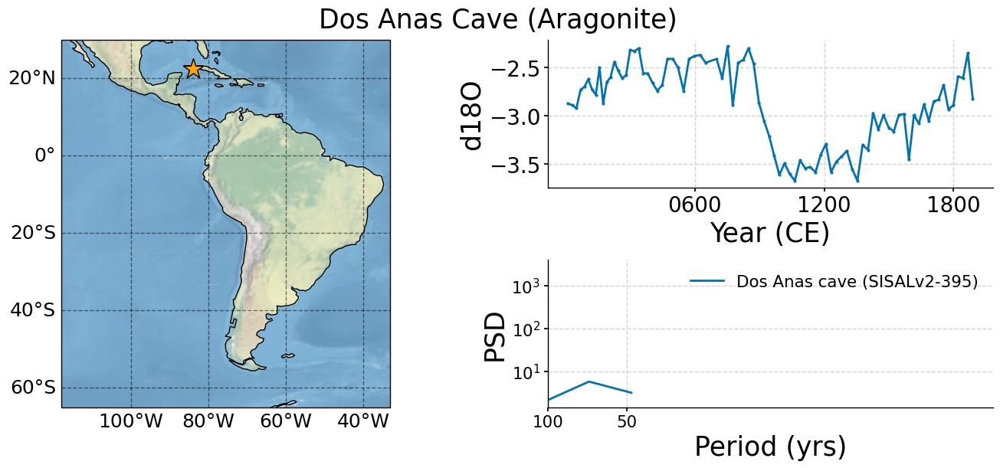

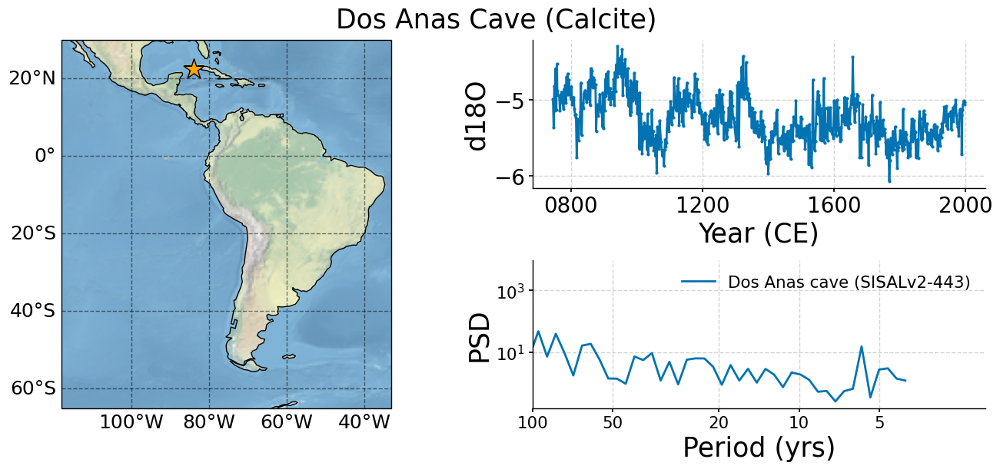

In [110]:
all_in_one(sisalv3,title='Dos Anas Cave (Aragonite)',ID=['SISALv2-395']);
all_in_one(sisalv3,title='Dos Anas Cave (Calcite)',ID=['SISALv2-443']);
#tamboril=plot_composites(name='Dos Anas Cave',ids=['SISALv2-395','SISALv2-443'],mode='longest',masked=True,lw=2,s=3,xlim=('0300','1100'),turn=False)

In [111]:
sisalv3[sisalv3['ID']=='SISALv2-147']

,paleoData_values,geo_meanLat,geo_meanLon,geo_meanElev,mineral,geo_siteName,pub1_doi,paleoData_hasResolution_hasMedianValue,minYear,maxYear,year,paleoData_variableName,archiveType,paleoData_units,ID
ID,,,,,,,,,,,,,,,
SISALv2-147,"[-4.65231454672, -5.30982295704, -6.1062783732...",20.73,270.284,20.0,calcite,Tzabnah cave,10.1016/j.epsl.2010.08.016,1.95,487.082,2004.0,"[2004.0, 2001.666, 2000.499, 2000.11, 1999.33,...",d18O,speleothem,permil,SISALv2-147


# Tzabnah cave

Median resolution  SISALv2-147 : 2.0  years. Record going from  487 - 2000 CE ( 1513 years)  | mean:  -5.0  std:  0.71  | doi:  10.1016/j.epsl.2010.08.016


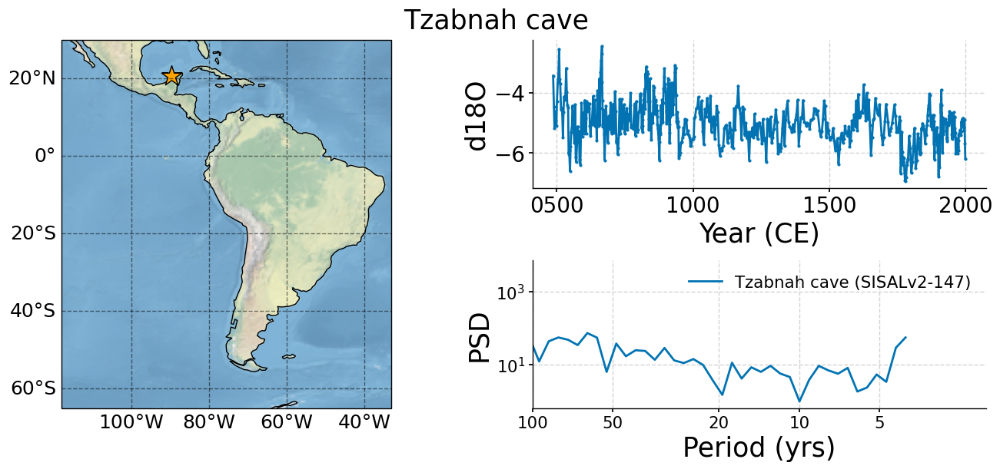

In [113]:
all_in_one(data=sisalv3,ID=['SISALv2-147']);

Median resolution  SISALv2-378 : 1.2  years. Record going from  1208 - 2000 CE ( 792 years)  | mean:  -2.5  std:  0.4  | doi:  10.1016/j.epsl.2011.05.028


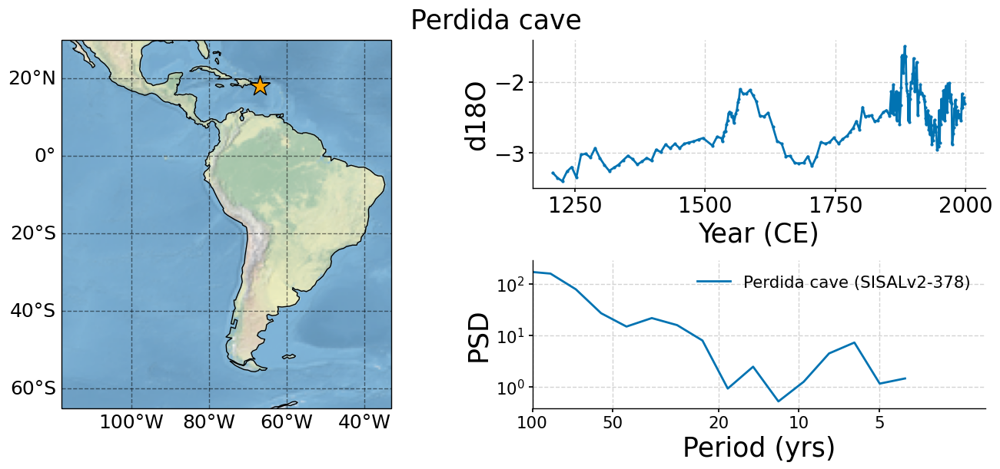

In [114]:
all_in_one(data=sisalv3,ID=['SISALv2-378']);

Median resolution  SISALv2-289 : 2.0  years. Record going from  949 - 1957 CE ( 1008 years)  | mean:  -8.4  std:  0.32  | doi:  10.1016/j.quascirev.2016.11.012
Median resolution  SISALv2-286 : 2.0  years. Record going from  1 - 2000 CE ( 1999 years)  | mean:  -8.0  std:  0.28  | doi:  10.1130/g32471.1


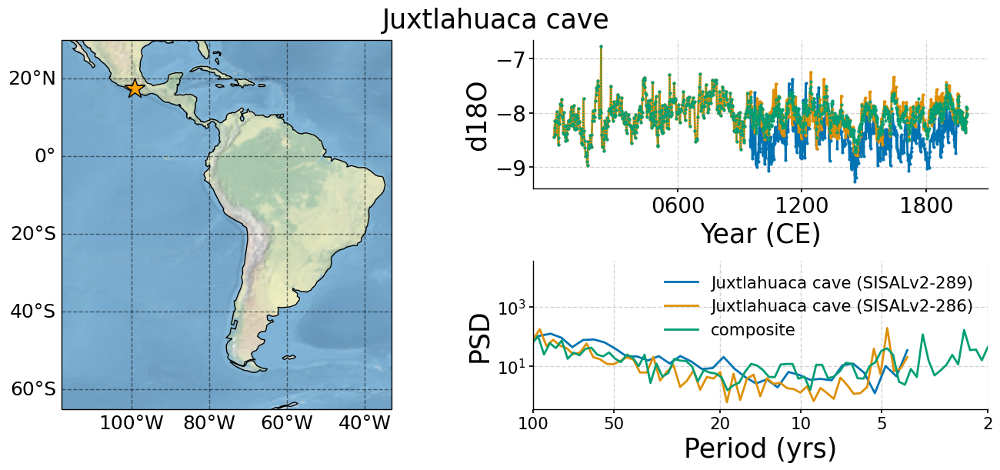

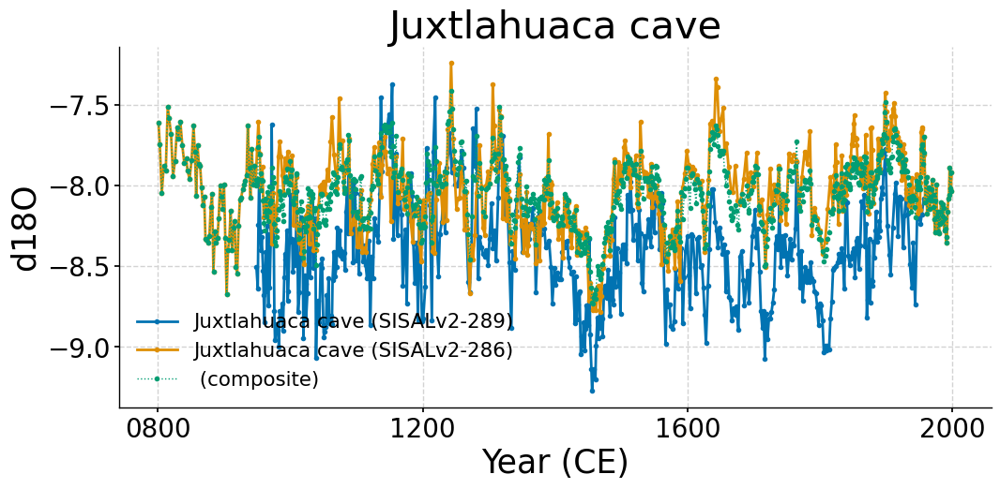

In [116]:
all_in_one(data=sisalv3,ID=['SISALv2-289','SISALv2-286']);
plot_composites(sisalv3,name='Juxtlahuaca cave',ids=['SISALv2-289','SISALv2-286'],mode='longest',masked=True,lw=2,s=3,xlim=('0800','2000'),turn=False);

Median resolution  SISALv2-178 : 3.1  years. Record going from  9 - 1992 CE ( 1983 years)  | mean:  -3.8  std:  0.63  | doi:  10.1016/j.palaeo.2016.07.007


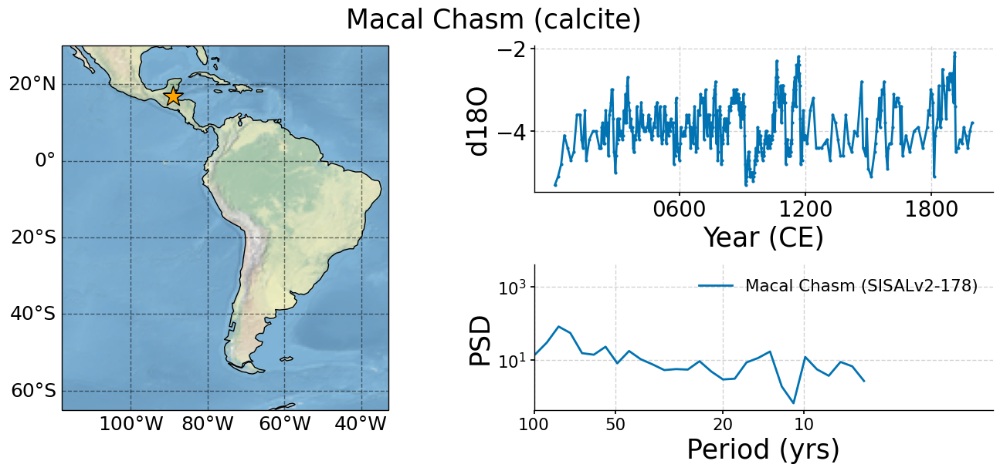

In [117]:
all_in_one(data=sisalv3,title='Macal Chasm (calcite)',ID=['SISALv2-178']);

# Yok Balum + Xibalba
-> Just take the long 209 record, as it already has high resolution and spans an intersting time span

Median resolution  SISALv2-440 : 0.5  years. Record going from  1698 - 2000 CE ( 302 years)  | mean:  -3.3  std:  0.27  | doi:  10.1038/ncomms8627
Median resolution  SISALv2-209 : 0.4  years. Record going from  1 - 2000 CE ( 1999 years)  | mean:  -3.8  std:  0.35  | doi:  10.1126/science.1226299
Median resolution  SISALv2-210 : 0.1  years. Record going from  1550 - 1983 CE ( 433 years)  | mean:  -4.6  std:  0.4  | doi:  10.1038/ngeo2353


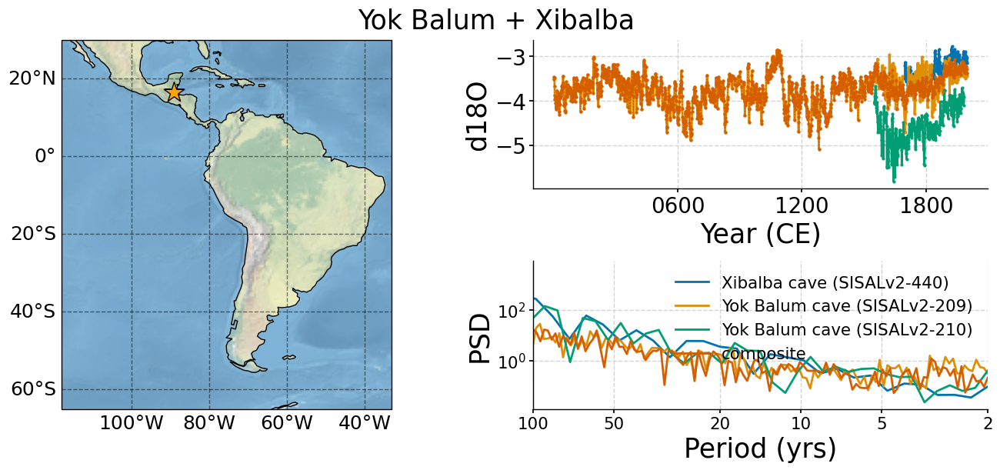

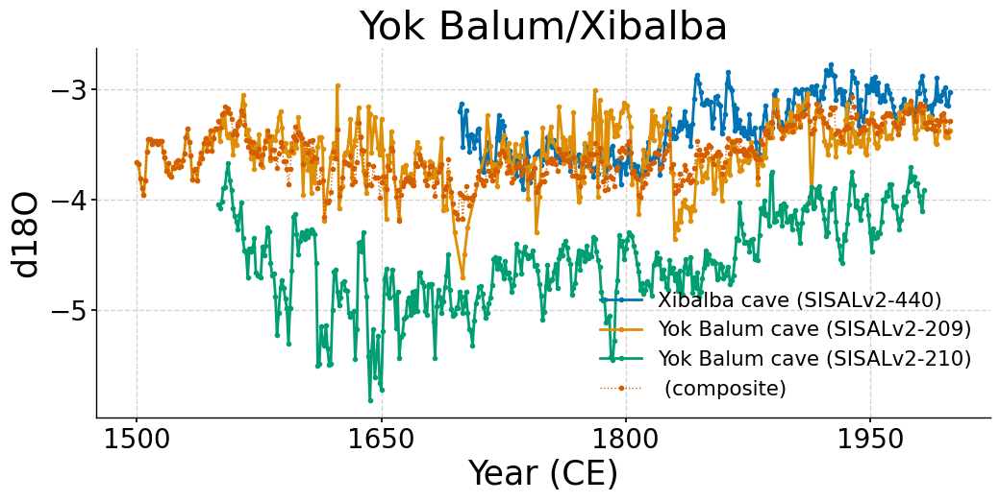

In [118]:
all_in_one(data=sisalv3,title='Yok Balum + Xibalba',ID=['SISALv2-440','SISALv2-209','SISALv2-210']);
plot_composites(sisalv3,name='Yok Balum/Xibalba',ids=['SISALv2-440','SISALv2-209','SISALv2-210'],mode='longest',masked=True,lw=2,s=3,xlim=('1500','2000'),turn=False);

Med resol 1.4869999999998527


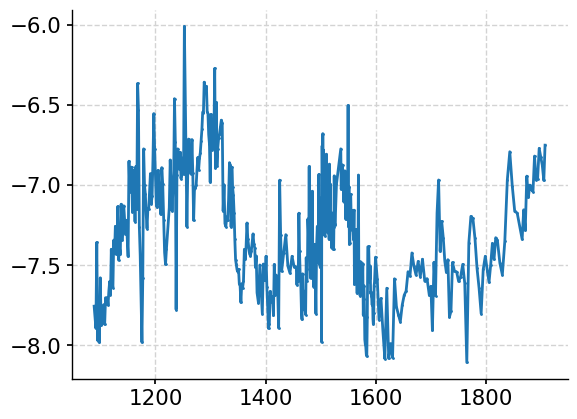

In [22]:
plot_sg('Cascayunga cave - D')

Med resol 1.3040000000000873


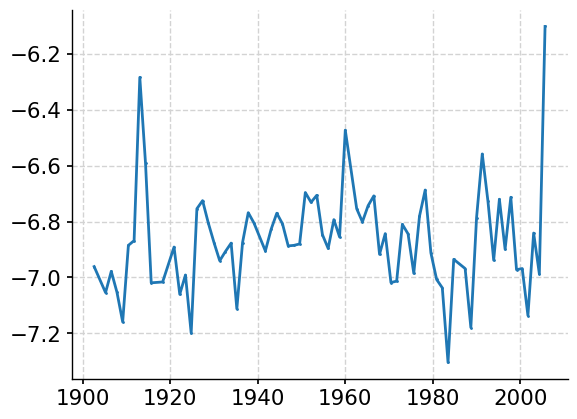

In [23]:
plot_sg('Cascayunga cave - A')

# Chilibrillo cave (old)
-> Does not span the seond millennium sufficiently

Median resolution  SISALv2-167 : 3.2  years. Record going from  2 - 1260 CE ( 1258 years)  | mean:  -5.4  std:  0.58


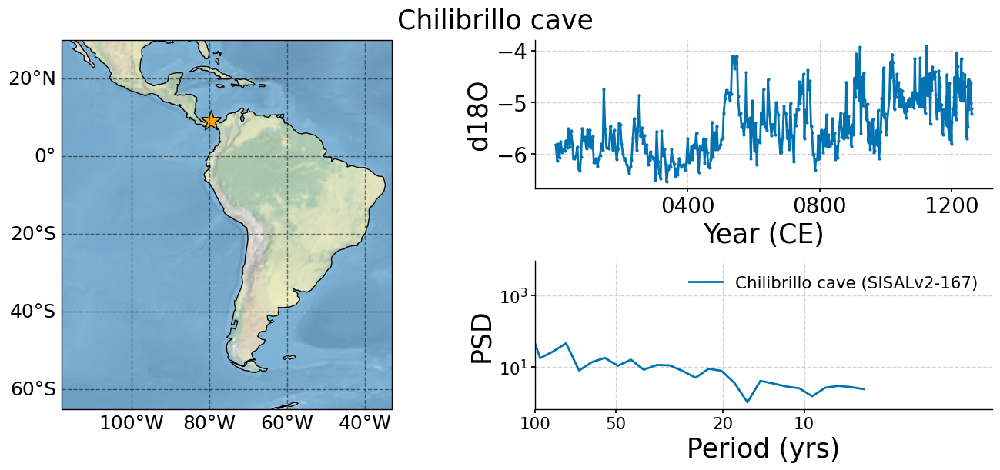

In [354]:
#all_in_one(data=sisalv2,ID=['SISALv2-167']);

# 3. Final compositing and file saving

In [119]:

#umajalanta-chiflonkhaka (COMPOSITE),
df=sisalv3[sisalv3['ID']=='SISALv2-518']
uma=plot_composites(sisalv3,name='Umajalanta- Chiflonka Caves',ids=['SISALv2-499','SISALv2-497','SISALv2-498','SISALv2-518'],mode='longest',masked=True,turn=False,xlim=('1000','1800'),plot=False)
vals=uma['composite'].dropna('time')
time=vals.time.dt.year.values
columns=df.columns
df=df.values
df[0][-1]='Umajalanta Composite'
df[0][0] = vals.values
df[0][8] =np.min(time)
df[0][9] =np.max(time)
df[0][10] =time
df=pd.DataFrame(df,columns=columns)
df=df.set_index('ID')
speleos=pd.concat([speleos,df])


#CASCAYUNGA COMPOSITE
df=sisalv3[sisalv3['ID']=='Cascayunga cave - D']
casca=plot_composites(sisalv3,name='Cascayunga composite',ids=['Cascayunga cave - D','Cascayunga cave - A'],mode='longest',masked=True,turn=False,xlim=('1000','1800'),plot=False)
vals=casca['composite'].dropna('time')
time=vals.time.dt.year.values
columns=df.columns
df=df.values
df[0][-1]='Cascayunga composite'
df[0][0] = vals.values
df[0][8] =np.min(time)
df[0][9] =np.max(time)
df[0][10] =time
df=pd.DataFrame(df,columns=columns)
df=df.set_index('ID')
speleos=pd.concat([speleos,df])

#'SISALv2-598', #huagapo (OWN COMPOSITE) 
df=sisalv3[sisalv3['ID']=='SISALv2-598']
huagapo=plot_composites(sisalv3,name='Huagapo cave',ids=['SISALv2-597','SISALv2-598'],mode='longest',masked=True,lw=2,s=2,xlim=('0500','1000'),turn=False,plot=False)
vals=huagapo['composite'].dropna('time')
time=vals.time.dt.year.values
columns=df.columns
df=df.values
df[0][-1]='Huagapo Composite'
df[0][0] = vals.values
df[0][8] =np.min(time)
df[0][9] =np.max(time)
df[0][10] =time
df=pd.DataFrame(df,columns=columns)
df=df.set_index('ID')
speleos=pd.concat([speleos,df])


#SAO BERNARDO-SAO MATHEO CAVE: SISALv2-431
b=plot_composites(sisalv3,name='Sao Bernardo + Sao Matheus',ids=['SISALv2-430','SISALv2-431'],mode='longest',masked=True,lw=2,s=3,xlim=(1000,1300),turn=False,plot=False)
df=sisalv3[sisalv3['ID']=='SISALv2-431']
vals=b['composite'].dropna('time')
time=vals.time.dt.year.values
columns=df.columns
columns=df.columns
df=df.values
df[0][-1]='Sao Bernardo-Sao Matheo composite'
df[0][0] = vals.values
df[0][8] =np.min(time)
df[0][9] =np.max(time)
df[0][10] =time
df=pd.DataFrame(df,columns=columns)
df=df.set_index('ID')
speleos=pd.concat([speleos,df])

#diva cave (own composite), for metadata: SISALv2-113
b=plot_composites(input_data=sisalv3,name='Diva & friends',ids=['SISALv2-113','SISALv2-146','SISALv2-203'],mode='longest',masked=True,lw=2,s=2,turn=False,xlim=('1800','2000'),plot=False);
df=sisalv3[sisalv3['ID']=='SISALv2-113']
vals=b['composite'].dropna('time')
time=vals.time.dt.year.values
columns=df.columns
columns=df.columns
df=df.values
df[0][-1]='Diva cave composite'
df[0][0] = vals.values
df[0][8] =np.min(time)
df[0][9] =np.max(time)
df[0][10] =time
df=pd.DataFrame(df,columns=columns)
df=df.set_index('ID')
speleos=pd.concat([speleos,df])




"""
CUICA CAVE ALREADY INCLUDED IN SISAL V3
#cuica cave (already in AD), Coordinates: -11.68, -60.64, Altitude: 310 ()
time=pd.read_excel('/home/mchoblet/south_america/proxies/valdir_newdata/data for Mathi.ods',sheet_name=None,skiprows=5,usecols='M')['Sheet1'].values.flatten()
values=pd.read_excel('/home/mchoblet/south_america/proxies/valdir_newdata/data for Mathi.ods',sheet_name=None,skiprows=5,usecols='N')['Sheet1'].values.flatten()
time=time[~np.isnan(values)]
values=values[~np.isnan(values)]
assert len(time)==len(values)
dic={'ID':'Cuica cave','paleoData_variableName':'d18O','archiveType':'speleothem','paleoData_units':'permil','paleoData_values':values, 'geo_meanElev':310,'geo_meanLat':-11.68,'geo_meanLon':360-60.64,'geo_siteName':'Cuica cave','year':time,'minYear':np.min(time),'maxYear':np.max(time),'paleoData_hasResolution_hasMedianValue':np.abs(np.median(time[1:]-time[:-1]))}
df=pd.DataFrame([dic]).set_index('ID')
sisalv2=pd.concat([sisalv2,df])

#cuica cave (Second record) (already in AD), Coordinates: -11.68, -60.64, Altitude: 310
time=pd.read_excel('/home/mchoblet/south_america/proxies/valdir_newdata/data for Mathi.ods',sheet_name=None,skiprows=5,usecols='M')['Sheet1'].values.flatten()
values=pd.read_excel('/home/mchoblet/south_america/proxies/valdir_newdata/data for Mathi.ods',sheet_name=None,skiprows=5,usecols='N')['Sheet1'].values.flatten()
time=time[~np.isnan(values)]
values=values[~np.isnan(values)]
assert len(time)==len(values)
dic={'ID':'Cuica cave (2)','paleoData_variableName':'d18O','archiveType':'speleothem','paleoData_units':'permil','paleoData_values':values, 'geo_meanElev':310,'geo_meanLat':-11.68,'geo_meanLon':360-60.64,'geo_siteName':'Cuica cave','year':time,'minYear':np.min(time),'maxYear':np.max(time),'paleoData_hasResolution_hasMedianValue':np.abs(np.median(time[1:]-time[:-1]))}
df=pd.DataFrame([dic]).set_index('ID')
sisalv2=pd.concat([sisalv2,df])
"""

#sisalv3['ID']=sisalv3.index
speleos['PSM']=['inf_weighted']*len(speleos)
speleos['seasonality']=['None']*len(speleos)
speleos['variable_name']=['d18O']*len(speleos)
speleos['noise_snr']=['assumed']*len(speleos)

speleos_final=dataframe_cftime(speleos)
speleos_final=table_to_xarray(speleos_final,start=1,end=2015) #cut between 0 and 2015 (Not 2000 for the resampling)
speleos_final.to_netcdf('/home/mchoblet/paleoda/data/proxy_dbs/paper/speleos.nc')

In [12]:
speleos

,paleoData_values,geo_meanLat,geo_meanLon,geo_meanElev,mineral,geo_siteName,pub1_doi,paleoData_hasResolution_hasMedianValue,minYear,maxYear,year,paleoData_variableName,archiveType,paleoData_units,ID,PSM,seasonality,variable_name,noise_snr
ID,,,,,,,,,,,,,,,,,,,
SISALv2-443,"[-5.02, -5.03, -5.06, -5.01, -5.06, -5.13, -5....",22.38,276.03,120.0,calcite,Dos Anas cave,10.1177/0959683612449759,1.84,746.96,2000.0,"[2000.0, 1998.16, 1996.32, 1994.48, 1992.64, 1...",d18O,speleothem,permil,SISALv2-443,inf_weighted,None,d18O,assumed
SISALv2-147,"[-4.65231454672, -5.30982295704, -6.1062783732...",20.73,270.284,20.0,calcite,Tzabnah cave,10.1016/j.epsl.2010.08.016,1.95,487.082,2004.0,"[2004.0, 2001.666, 2000.499, 2000.11, 1999.33,...",d18O,speleothem,permil,SISALv2-147,inf_weighted,None,d18O,assumed
SISALv2-378,"[-2.243, -2.357, -2.516, -2.304, -2.224, -2.30...",18.0,293.0,350.0,calcite,Perdida cave,10.1016/j.epsl.2011.05.028,1.16,1208.0,2003.84,"[2003.84, 2002.68, 2000.36, 1998.04, 1996.88, ...",d18O,speleothem,permil,SISALv2-378,inf_weighted,None,d18O,assumed
SISALv2-286,"[-7.60475, -7.65375, -8.00175, -7.87975, -7.69...",17.4,260.8,934.0,aragonite,Juxtlahuaca cave,10.1130/g32471.1,1.97106,-49.738486,2010.052344,"[2010.05234411, 2009.25703233, 2008.46172056, ...",d18O,speleothem,permil,SISALv2-286,inf_weighted,None,d18O,assumed
SISALv2-178,"[-3.8, -4.0, -4.4, -4.1, -3.9, -4.3, -4.2, -4....",16.883,270.892,530.0,calcite,Macal Chasm,10.1016/j.palaeo.2016.07.007,3.2,-49.6,1992.6,"[1992.6, 1982.5, 1972.8, 1962.9, 1953.5, 1944....",d18O,speleothem,permil,SISALv2-178,inf_weighted,None,d18O,assumed
SISALv2-209,"[-2.95, -3.04, -3.17, -3.17, -3.1, -3.1, -3.09...",16.2086,270.9265,336.0,aragonite,Yok Balum cave,10.1126/science.1226299,0.42155,-14.6212,2005.5069,"[2005.5069, 2005.4984, 2005.4731, 2005.4312, 2...",d18O,speleothem,permil,SISALv2-209,inf_weighted,None,d18O,assumed
Caripe Cave,"[-4.31, -4.26, -4.74, -4.35, -3.86, -4.21, -3....",10.17,296.45,1090,NaN,Caripe Cave,https://doi.org/10.1016/j.quascirev.2023.108056,1.5,-307.4,1993.0,"[1993.0, 1990.3, 1987.5, 1984.8, 1982.0, 1979....",d18O,speleothem,permil,NaN,inf_weighted,None,d18O,assumed
SISALv2-424,"[-5.93, -6.18, -6.25, -5.58, -6.08, -6.24, -6....",-4.0667,304.55,60.0,calcite,Paraiso cave,10.1038/nature20787,7.09,-43.6,1998.046,"[1998.046, 1992.278, 1986.511, 1980.743, 1974....",d18O,speleothem,permil,SISALv2-424,inf_weighted,None,d18O,assumed
SISALv2-861,"[-3.61, -3.2, -3.13, -3.59, -3.0, -3.11, -3.81...",-5.6,322.3,72.0,calcite,Trapiá cave,10.1016/j.quascirev.2020.106655,2.84,-44.75,1932.61,"[1932.61, 1932.51, 1932.41, 1932.31, 1932.21, ...",d18O,speleothem,permil,SISALv2-861,inf_weighted,None,d18O,assumed


In [11]:
speleos_final

<xarray.DataArray (time: 2015, site: 22)>
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]])
Coordinates: (12/13)
  * time                    (time) object 0001-01-01 00:00:00 ... 2015-01-01 ...
    geo_meanLat             (site) object 22.38 20.73 18.0 ... -21.083 -24.52
    geo_meanLon             (site) object 276.03 270.284 ... 311.40999999999997
    geo_siteName            (site) object 'Dos Anas cave' ... 'Cristal Cave'
    pub1_doi                (site) object '10.1177/0959683612449759' ... 'htt...
    minYear                 (site) object 746.96 ... -1980.38620689655
    ...                      ...
    paleoData_variableName  (site) object 'd18O' 'd18O' 'd18O' ... 'd18O' 'd18O'
    archiveType             (site) object 'speleothem' ... 'speleothem'
    PSM                     (site) object 'inf_weighted' ... 'inf_weighted'
    seasonality             (site) object 'None' 'None' 'None' ... 'None' 'None'
    variable_name           (site) object 'd18O' 'd18O' 'd18O' ... 'd18O' 'd18O'
    noise_snr               (site) object 'assumed' 'assumed' ... 'assumed'
Dimensions without coordinates: site

In [47]:
speleos_final.drop_isel(site=7).to_netcdf('/home/mchoblet/paleoda/data/proxy_dbs/paper/speleos_no_paraiso.nc')